# Treamid - HuRI

## Filter Data

Seperating `summary_new.csv` file to different `Recursion Step Done`!

In [1]:
from sklearn.metrics import r2_score
import numpy as np
import seaborn as sns
import pandas as pd
import matplotlib.pyplot as plt


# Function to filter the CSV file
def filter_csv(input_file_path, output_file_path, recursion_step='1/5'):
    """
    Filters rows in a CSV file where 'Recursion Step Done' equals a specific value.

    Parameters:
    - input_file_path: Path to the input CSV file.
    - output_file_path: Path where the filtered CSV file will be saved.
    - recursion_step: The recursion step value to filter by (default is '1/5').
    """
    # Load the CSV file
    data = pd.read_csv(input_file_path)

    # Filter the dataframe
    filtered_data = data[
        (data['Recursion Step Done'] == recursion_step) &
        (data['Binding Affinity (kcal/mol)'] < 20) &
        (data['Number of clashes'] < 20) &
        (data['Strain Energy'] < 20) &
        (data['Confidence Score'] > -10)
    ]

    # Save the filtered data to a new CSV file
    filtered_data.to_csv(output_file_path, index=False)
    print(f"Filtered data for recursion step {recursion_step} saved to: {output_file_path}")


In [2]:
# Base directory and filename patterns
base_dir = '/fast/AG_Akalin/asarigun/Arcas_Stage_1/ROOF/COMPASS/experiments/HURI/data/'
input_filename = 'summary_new.csv'
output_filename_pattern = 'filtered_summary_new_rec_{}.csv'

# Full input file path
input_file_path = base_dir + input_filename

# Loop over the recursion steps
for step in range(1, 6):
    recursion_step = f'{step}/5'
    output_file_path = base_dir + output_filename_pattern.format(step)
    filter_csv(input_file_path, output_file_path, recursion_step=recursion_step)


Filtered data for recursion step 1/5 saved to: /fast/AG_Akalin/asarigun/Arcas_Stage_1/ROOF/COMPASS/experiments/HURI/data/filtered_summary_new_rec_1.csv
Filtered data for recursion step 2/5 saved to: /fast/AG_Akalin/asarigun/Arcas_Stage_1/ROOF/COMPASS/experiments/HURI/data/filtered_summary_new_rec_2.csv
Filtered data for recursion step 3/5 saved to: /fast/AG_Akalin/asarigun/Arcas_Stage_1/ROOF/COMPASS/experiments/HURI/data/filtered_summary_new_rec_3.csv
Filtered data for recursion step 4/5 saved to: /fast/AG_Akalin/asarigun/Arcas_Stage_1/ROOF/COMPASS/experiments/HURI/data/filtered_summary_new_rec_4.csv
Filtered data for recursion step 5/5 saved to: /fast/AG_Akalin/asarigun/Arcas_Stage_1/ROOF/COMPASS/experiments/HURI/data/filtered_summary_new_rec_5.csv


## Read Each Seperated Files

In [3]:
# Loop over the recursion steps and read each file
for step in range(1, 6):
    file_path = f'{base_dir}{output_filename_pattern.format(step)}'
    data = pd.read_csv(file_path)
    num_rows = data.shape[0]  
    print(f'Total number of data points for recursion step {step}/5: {num_rows}')
    print(f'First few rows of the dataframe for recursion step {step}/5:')
    display(data.head()) 
    

Total number of data points for recursion step 1/5: 63110
First few rows of the dataframe for recursion step 1/5:


,Protein ID,Recursion Step Done,Ligand Description,Binding Affinity (kcal/mol),Number of clashes,Strain Energy,Confidence Score,Rank of sdf,_timestamp,_runtime,_step
0,ENSG00000127445-ENSG00000254997_ENSG00000254997,1/5,NaN,-0.777326,0.0,8.466624,-3.52,rank1_confidence-3.52,1.712197e+09,17.015705,8
1,ENSG00000106511-ENSG00000163481_ENSG00000106511,1/5,NaN,-2.445468,2.0,5.727036,-2.20,rank1_confidence-2.20,1.712283e+09,37.914272,8
2,ENSG00000133134-ENSG00000204889_ENSG00000133134,1/5,NaN,-1.696501,1.0,7.499030,-1.90,rank1_confidence-1.90,1.712472e+09,155.939147,8
3,ENSG00000174016-ENSG00000196843_ENSG00000174016,1/5,NaN,-3.441623,1.0,6.324892,-1.35,rank1_confidence-1.35,1.712564e+09,423.931166,8
4,ENSG00000117533-ENSG00000213921_ENSG00000117533,1/5,NaN,-0.360689,7.0,6.628386,-3.41,rank1_confidence-3.41,1.712041e+09,19.801073,8


Total number of data points for recursion step 2/5: 4585
First few rows of the dataframe for recursion step 2/5:


,Protein ID,Recursion Step Done,Ligand Description,Binding Affinity (kcal/mol),Number of clashes,Strain Energy,Confidence Score,Rank of sdf,_timestamp,_runtime,_step
0,ENSG00000142731-ENSG00000175793_ENSG00000175793,2/5,/fast/AG_Akalin/asarigun/Arcas_Stage_1/ROOF/FA...,-4.041207,10.0,7.035287,-1.81,rank1_confidence-1.81,1.712351e+09,164.198632,8
1,ENSG00000161011-ENSG00000170296_ENSG00000170296,2/5,/fast/AG_Akalin/asarigun/Arcas_Stage_1/ROOF/FA...,-3.777976,7.0,7.468762,-1.02,rank1_confidence-1.02,1.712559e+09,453.857196,8
2,ENSG00000166797-ENSG00000205808_ENSG00000166797,2/5,/fast/AG_Akalin/asarigun/Arcas_Stage_1/FACTORY...,-2.942985,2.0,6.412409,-1.31,rank1_confidence-1.31,1.712030e+09,13.952482,8
3,ENSG00000073008-ENSG00000264343_ENSG00000073008,2/5,/fast/AG_Akalin/asarigun/Arcas_Stage_1/FACTORY...,-1.002087,0.0,6.172349,-0.87,rank1_confidence-0.87,1.712094e+09,84.066151,8
4,ENSG00000114354-ENSG00000169813_ENSG00000169813,2/5,/fast/AG_Akalin/asarigun/Arcas_Stage_1/FACTORY...,-2.616034,9.0,10.063248,-1.32,rank1_confidence-1.32,1.712008e+09,18.101724,8


Total number of data points for recursion step 3/5: 1819
First few rows of the dataframe for recursion step 3/5:


,Protein ID,Recursion Step Done,Ligand Description,Binding Affinity (kcal/mol),Number of clashes,Strain Energy,Confidence Score,Rank of sdf,_timestamp,_runtime,_step
0,ENSG00000132467-ENSG00000161202_ENSG00000132467,3/5,/fast/AG_Akalin/asarigun/Arcas_Stage_1/ROOF/FA...,-3.136676,15.0,7.166102,-0.92,rank1_confidence-0.92,1.713118e+09,34.169826,8
1,ENSG00000101871-ENSG00000156587_ENSG00000101871,3/5,/fast/AG_Akalin/asarigun/Arcas_Stage_1/ROOF/FA...,-3.004992,3.0,8.631319,-1.60,rank1_confidence-1.60,1.712597e+09,306.502892,8
2,ENSG00000100109-ENSG00000141570_ENSG00000141570,3/5,/fast/AG_Akalin/asarigun/Arcas_Stage_1/FACTORY...,-4.870072,4.0,5.530127,-1.13,rank1_confidence-1.13,1.712227e+09,26.985975,8
3,ENSG00000146281-ENSG00000168763_ENSG00000146281,3/5,/fast/AG_Akalin/asarigun/Arcas_Stage_1/ROOF/FA...,-6.027958,13.0,4.530736,-0.71,rank1_confidence-0.71,1.713146e+09,52.257782,8
4,ENSG00000094796-ENSG00000101336_ENSG00000101336,3/5,/fast/AG_Akalin/asarigun/Arcas_Stage_1/FACTORY...,-6.915703,7.0,8.748990,-0.43,rank1_confidence-0.43,1.712200e+09,18.362609,8


Total number of data points for recursion step 4/5: 1029
First few rows of the dataframe for recursion step 4/5:


,Protein ID,Recursion Step Done,Ligand Description,Binding Affinity (kcal/mol),Number of clashes,Strain Energy,Confidence Score,Rank of sdf,_timestamp,_runtime,_step
0,ENSG00000137404-ENSG00000262576_ENSG00000137404,4/5,/fast/AG_Akalin/asarigun/Arcas_Stage_1/ROOF/FA...,-4.643939,18.0,8.659699,-0.64,rank1_confidence-0.64,1.712293e+09,79.937968,8
1,ENSG00000100151-ENSG00000234616_ENSG00000100151,4/5,/fast/AG_Akalin/asarigun/Arcas_Stage_1/ROOF/FA...,-5.409276,10.0,8.264241,-0.75,rank1_confidence-0.75,1.712816e+09,706.876655,8
2,ENSG00000127445-ENSG00000145687_ENSG00000127445,4/5,/fast/AG_Akalin/asarigun/Arcas_Stage_1/FACTORY...,-4.235788,18.0,6.842942,-1.09,rank1_confidence-1.09,1.712196e+09,26.346768,8
3,ENSG00000135018-ENSG00000158552_ENSG00000158552,4/5,/fast/AG_Akalin/asarigun/Arcas_Stage_1/ROOF/FA...,-3.242839,16.0,4.316568,-0.96,rank1_confidence-0.96,1.712423e+09,207.008276,8
4,ENSG00000065328-ENSG00000175602_ENSG00000065328,4/5,/fast/AG_Akalin/asarigun/Arcas_Stage_1/FACTORY...,-3.286295,11.0,5.734189,-1.04,rank1_confidence-1.04,1.712029e+09,21.997144,8


Total number of data points for recursion step 5/5: 673
First few rows of the dataframe for recursion step 5/5:


,Protein ID,Recursion Step Done,Ligand Description,Binding Affinity (kcal/mol),Number of clashes,Strain Energy,Confidence Score,Rank of sdf,_timestamp,_runtime,_step
0,ENSG00000104812-ENSG00000136826_ENSG00000136826,5/5,/fast/AG_Akalin/asarigun/Arcas_Stage_1/ROOF/FA...,-1.687511,16.0,6.511048,-1.42,rank1_confidence-1.42,1.712479e+09,126.156249,8
1,ENSG00000100151-ENSG00000187024_ENSG00000100151,5/5,/fast/AG_Akalin/asarigun/Arcas_Stage_1/ROOF/FA...,-3.735197,17.0,6.073034,-1.29,rank1_confidence-1.29,1.712765e+09,649.880304,8
2,ENSG00000161011-ENSG00000170296_ENSG00000170296,5/5,/fast/AG_Akalin/asarigun/Arcas_Stage_1/ROOF/FA...,-3.705091,1.0,5.819493,-0.99,rank1_confidence-0.99,1.712560e+09,409.957998,8
3,ENSG00000062194-ENSG00000160207_ENSG00000160207,5/5,/fast/AG_Akalin/asarigun/Arcas_Stage_1/FACTORY...,-2.219365,5.0,8.024738,-0.90,rank1_confidence-0.90,1.712018e+09,26.583854,8
4,ENSG00000130518-ENSG00000160014_ENSG00000130518,5/5,/fast/AG_Akalin/asarigun/Arcas_Stage_1/ROOF/FA...,-0.930709,5.0,10.739445,-0.12,rank1_confidence-0.12,1.713119e+09,51.796495,8


## Data Distributions

Total number of data points for recursion step 1/5: 63110


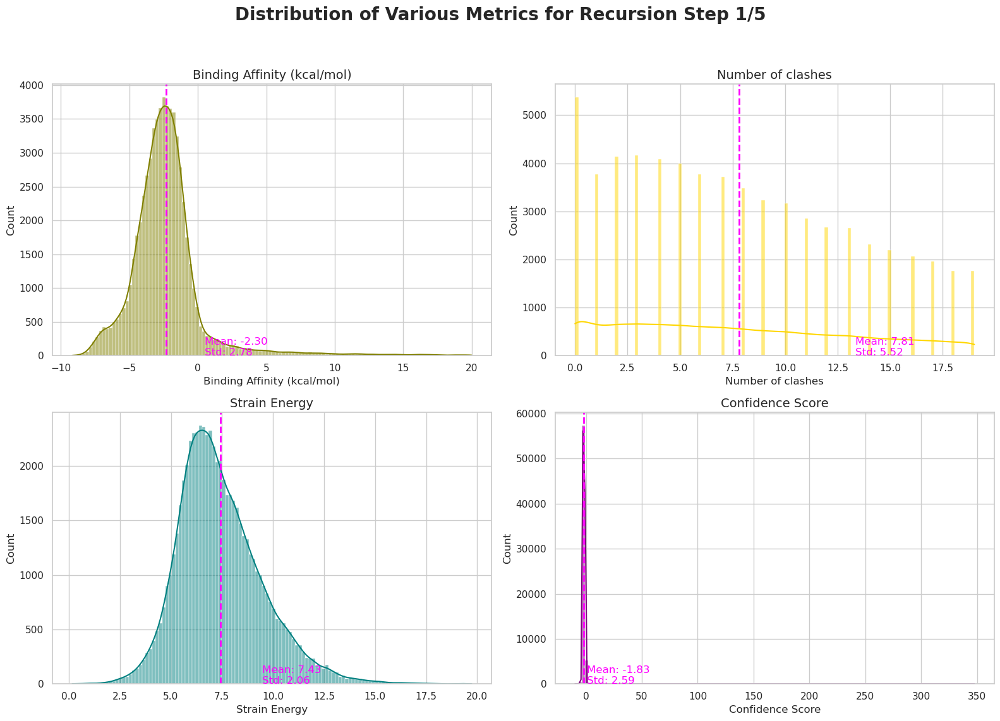

Total number of data points for recursion step 2/5: 4585


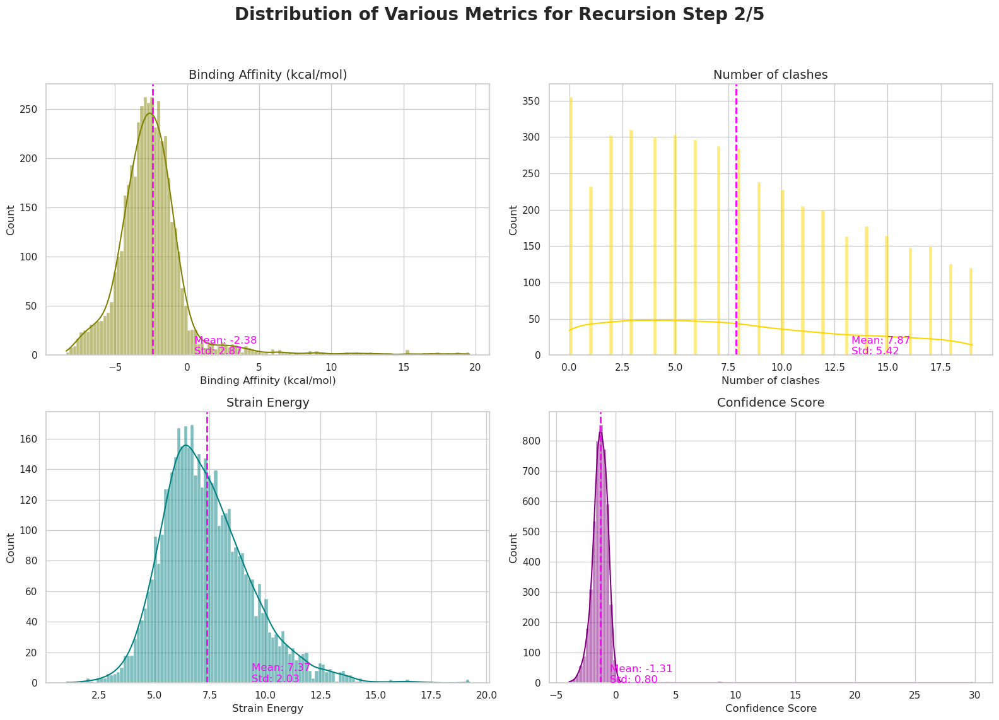

Total number of data points for recursion step 3/5: 1819


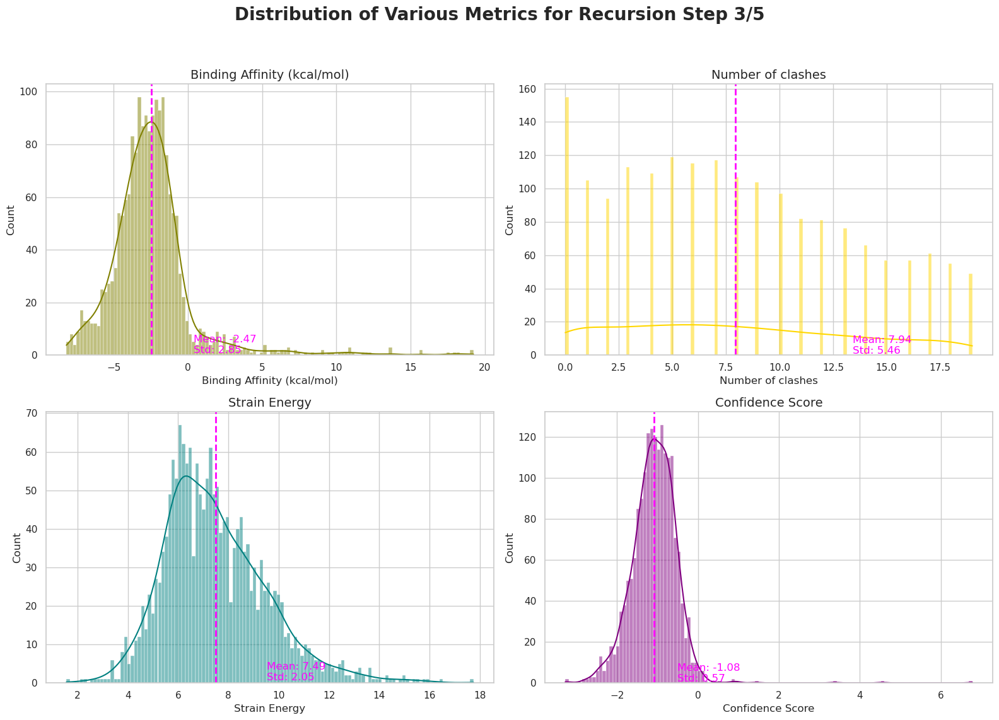

Total number of data points for recursion step 4/5: 1029


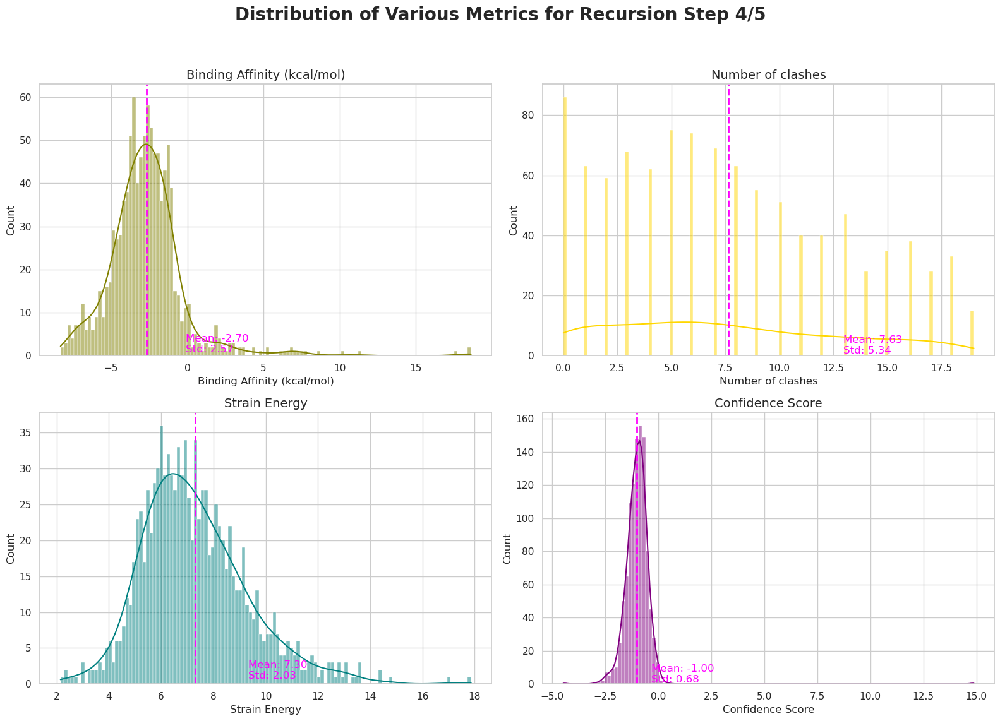

Total number of data points for recursion step 5/5: 673


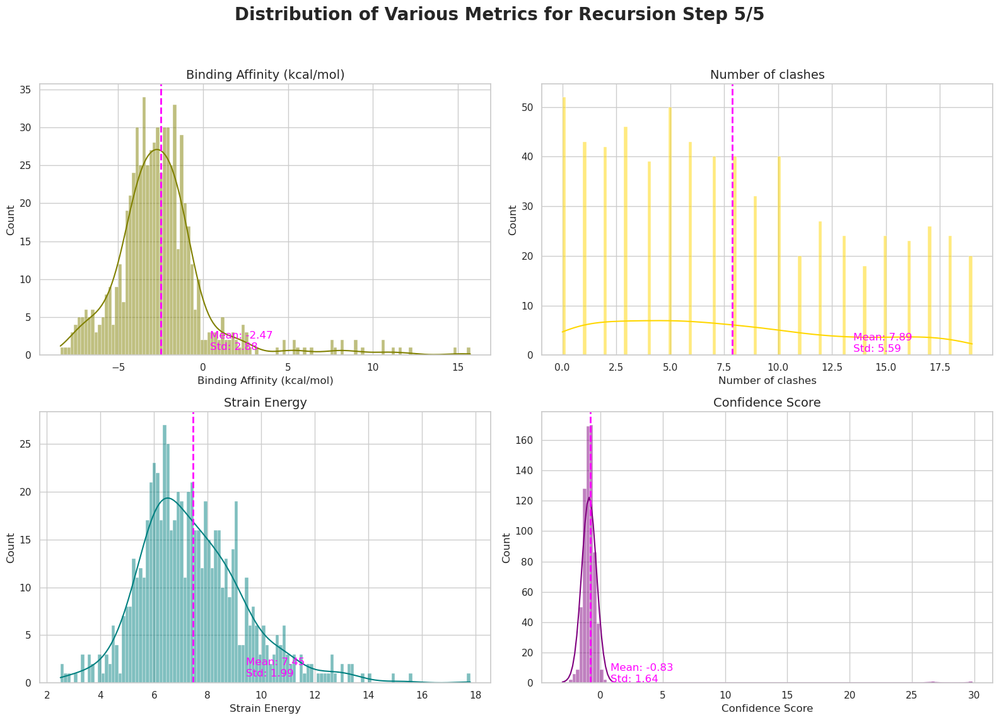

In [4]:
# Function to plot distributions of metrics from a given dataset
def plot_metrics_distributions(data, figure_title):
    # Set the overall aesthetics
    sns.set(style="whitegrid", palette="pastel")

    # Prepare the figure with a larger size for better readability
    fig, axes = plt.subplots(2, 2, figsize=(16, 12))  # Increased figure size for better legibility
    fig.suptitle(figure_title, fontsize=20, fontweight='bold')

    # Define a common bin size for comparable scales
    common_bins = 120  # Example bin size, adjust based on data distribution

    # List of metrics to plot
    metrics = ['Binding Affinity (kcal/mol)', 'Number of clashes', 'Strain Energy', 'Confidence Score']
    colors = ['olive', 'gold', 'teal', 'purple']

    # Plotting distributions
    for i, metric in enumerate(metrics):
        ax = axes.flat[i]
        sns.histplot(data=data, x=metric, kde=True, ax=ax, color=colors[i], bins=common_bins)
        ax.set_title(metric, fontsize=14)
        ax.grid(True)

        # Calculate mean and std, and annotate on the plots
        mean_value = data[metric].mean()
        std_value = data[metric].std()
        ax.axvline(mean_value, color='magenta', linestyle='dashed', linewidth=2)
        ax.text(mean_value + std_value, 0.7, f'Mean: {mean_value:.2f}\nStd: {std_value:.2f}', color='magenta', ha='left')

    # Adjust layout for a clean look and ensure the titles and labels don't overlap
    plt.tight_layout(rect=[0, 0.03, 1, 0.95])

    # Show plot
    plt.show()


# Loop over the recursion steps and plot for each step
for step in range(1, 6):
    file_path = f'{base_dir}{output_filename_pattern.format(step)}'
    data = pd.read_csv(file_path)
    num_rows = data.shape[0]  
    print(f'Total number of data points for recursion step {step}/5: {num_rows}')
    plot_metrics_distributions(data, f'Distribution of Various Metrics for Recursion Step {step}/5')


## Data Distribution Ranges

Total number of data points for recursion step 1/5: 63110


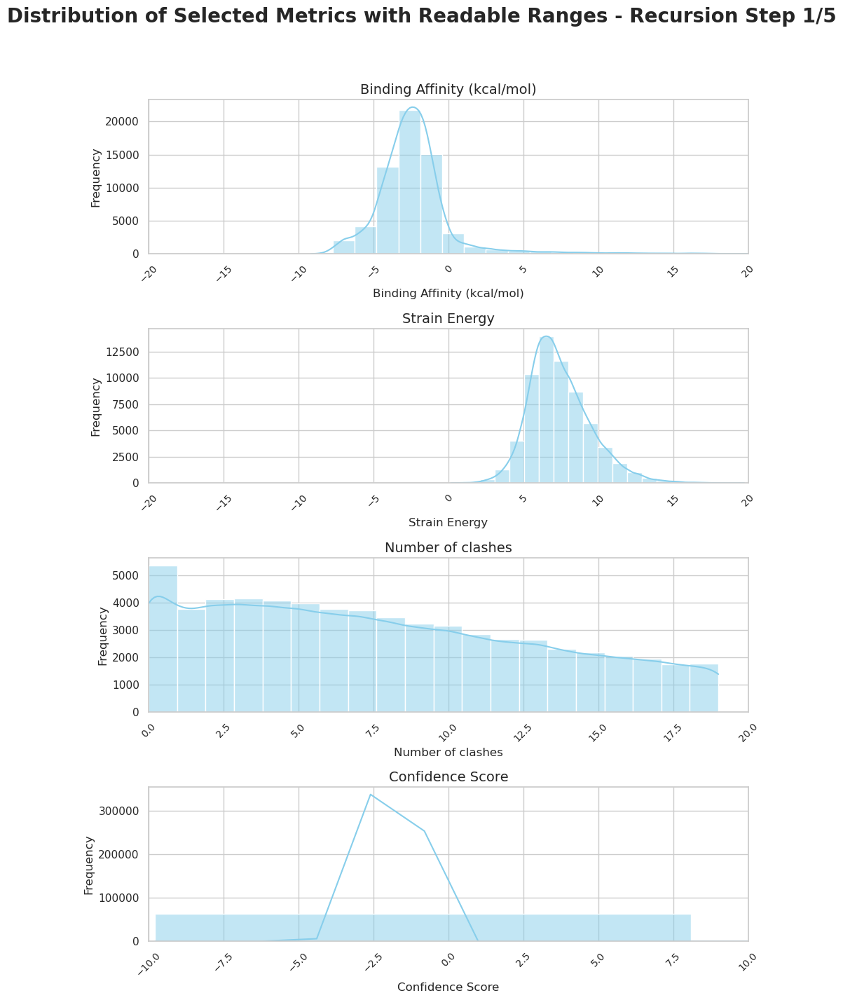

Total number of data points for recursion step 2/5: 4585


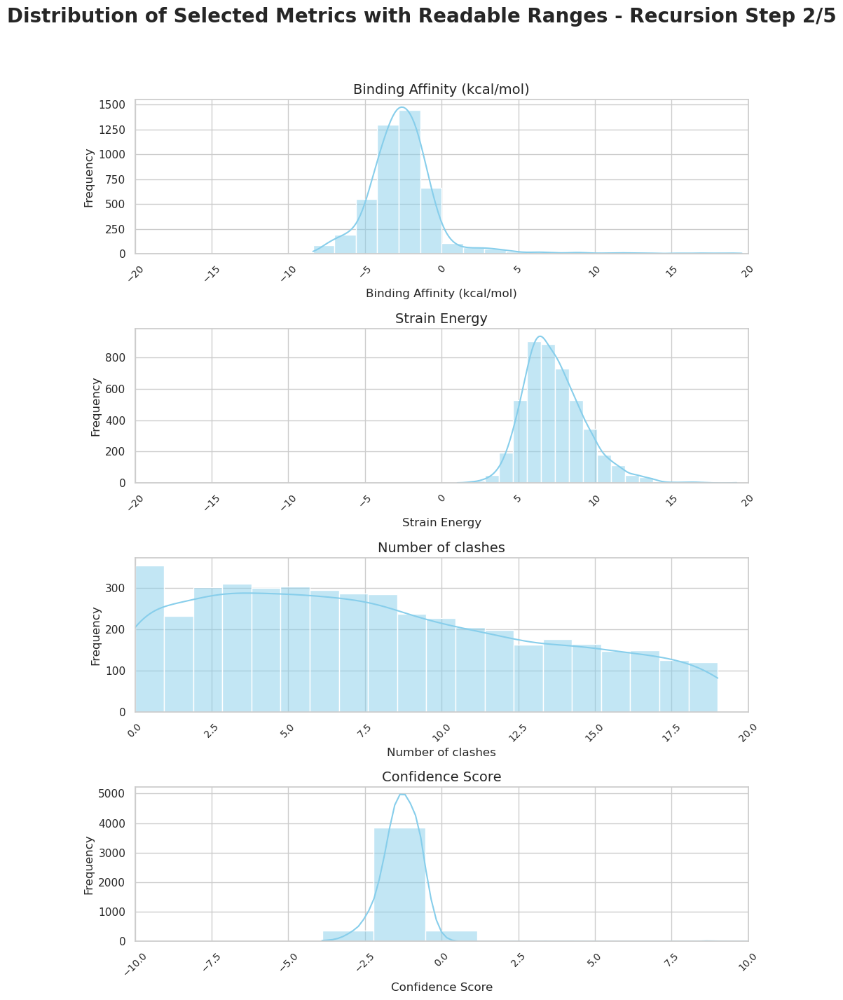

Total number of data points for recursion step 3/5: 1819


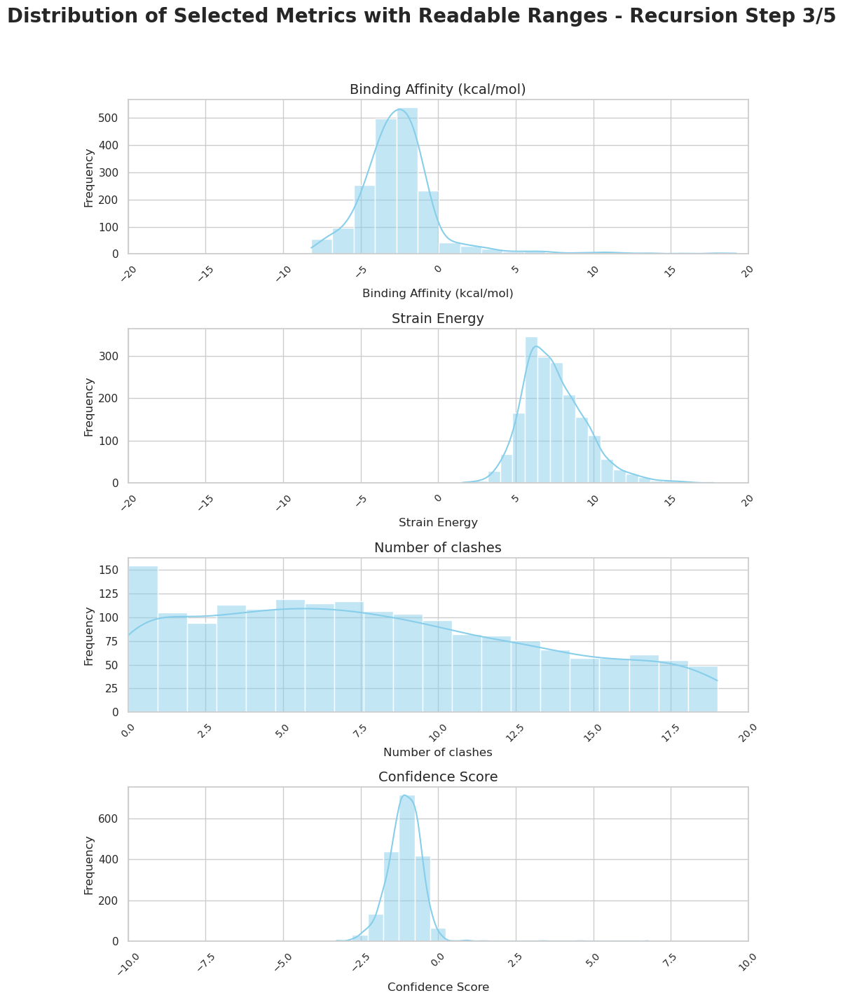

Total number of data points for recursion step 4/5: 1029


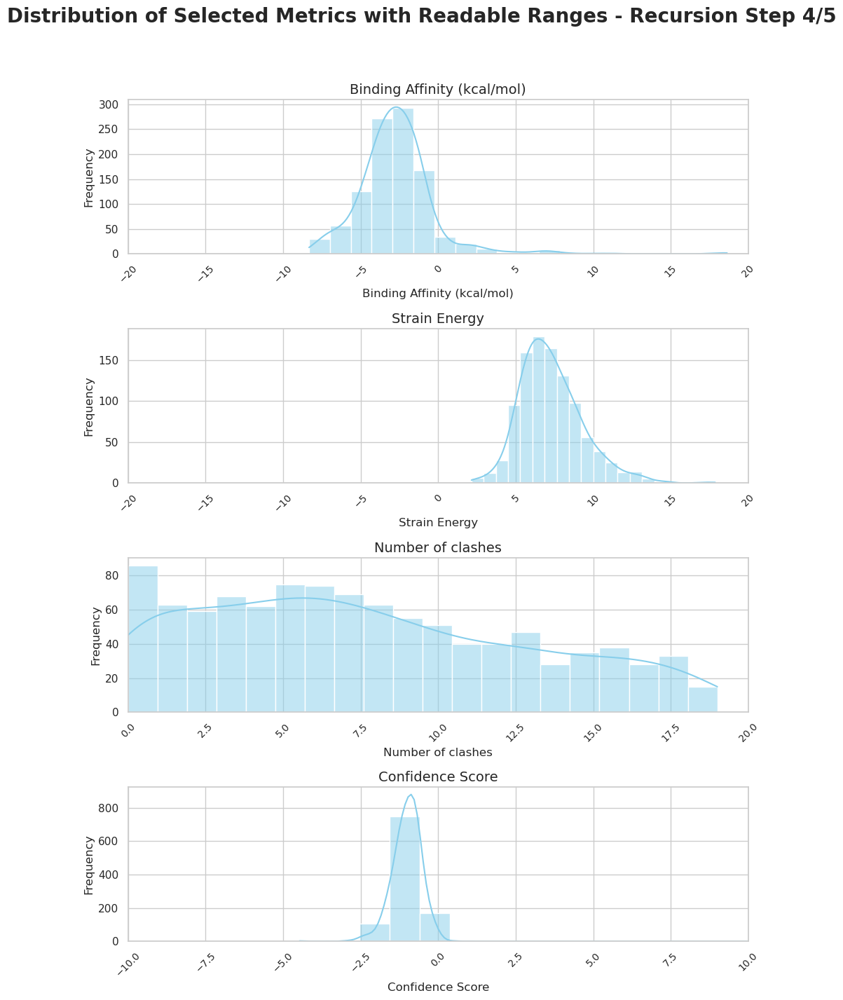

Total number of data points for recursion step 5/5: 673


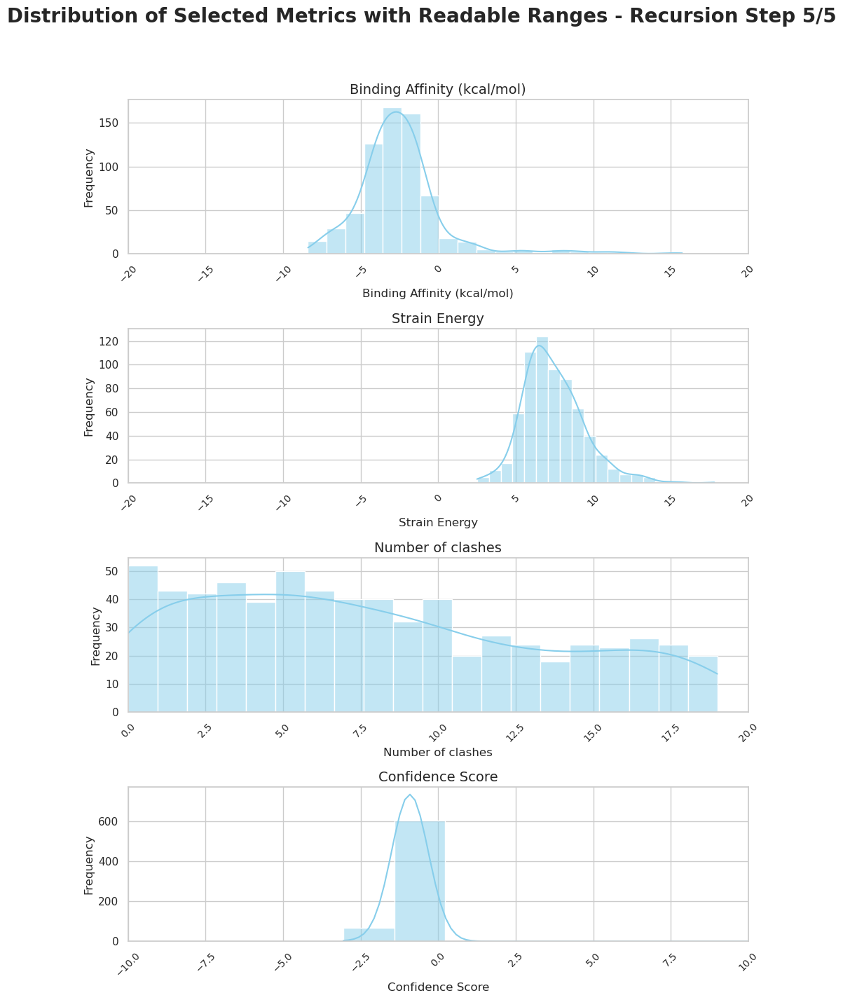

In [5]:
# Function to plot histograms with readable ranges for a given dataset
def plot_histograms_with_readable_ranges(data, title_suffix):
    # Enhancing overall aesthetics
    sns.set(style="whitegrid", palette="pastel")

    # Initializing a larger figure for clearer detail
    fig, axes = plt.subplots(4, 1, figsize=(10, 15))  # Using a vertical layout for better x-axis label readability

    # Titles and customization for improved readability
    fig.suptitle(f'Distribution of Selected Metrics with Readable Ranges - {title_suffix}', fontsize=20, fontweight='bold')

    # Adjusting bin sizes and x-axis limits for clarity
    metrics_info = {
        'Binding Affinity (kcal/mol)': {'bins': 20, 'ax': axes[0], 'xlim': (-20, 20)},
        'Strain Energy': {'bins': 20, 'ax': axes[1], 'xlim': (-20, 20)},
        'Number of clashes': {'bins': 20, 'ax': axes[2], 'xlim': (0, 20)},
        'Confidence Score': {'bins': 20, 'ax': axes[3], 'xlim': (-10, 10)}
    }

    for metric, info in metrics_info.items():
        sns.histplot(data=data, x=metric, kde=True, ax=info['ax'], bins=info['bins'], color='skyblue')
        info['ax'].set_title(metric, fontsize=14)
        info['ax'].set_xlabel(metric, fontsize=12)
        info['ax'].set_ylabel('Frequency', fontsize=12)
        info['ax'].set_xlim(info['xlim'])  # Adjusting x-axis limits for focusing on interesting ranges
        info['ax'].tick_params(axis='x', labelsize=10, rotation=45)

    plt.tight_layout(rect=[0, 0.03, 1, 0.95])
    plt.show()



# Loop over the recursion steps and plot for each step
for step in range(1, 6):
    file_path = f'{base_dir}{output_filename_pattern.format(step)}'
    data = pd.read_csv(file_path)
    num_rows = data.shape[0]  
    print(f'Total number of data points for recursion step {step}/5: {num_rows}')
    plot_histograms_with_readable_ranges(data, f'Recursion Step {step}/5')


## Correlation Between Confidence Score vs Physical Scores (Binding Affinity, Strain Energy, Number of Clashes) 

- This is all data without selecting range values

Total number of data points for recursion step 1/5: 63110


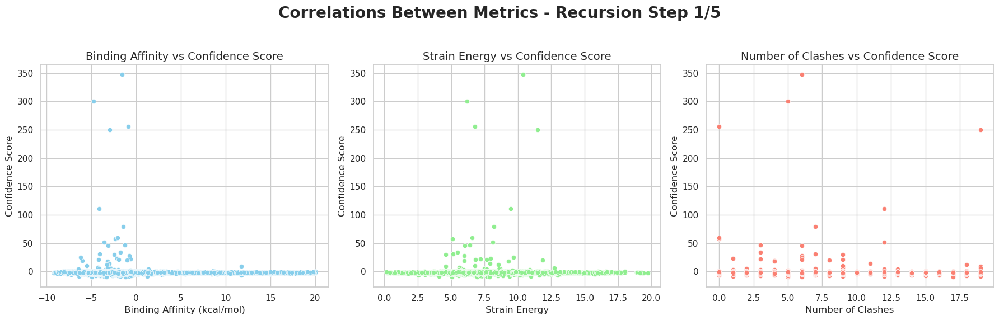

Total number of data points for recursion step 2/5: 4585


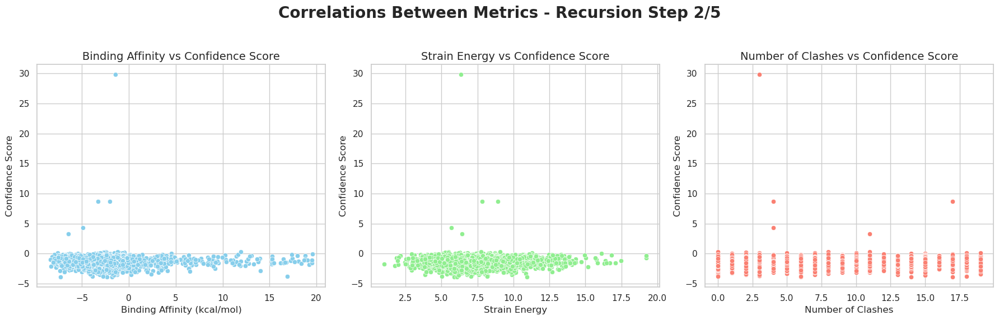

Total number of data points for recursion step 3/5: 1819


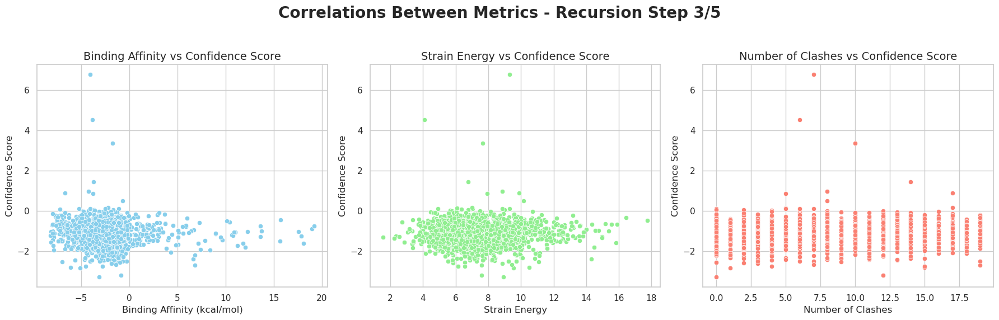

Total number of data points for recursion step 4/5: 1029


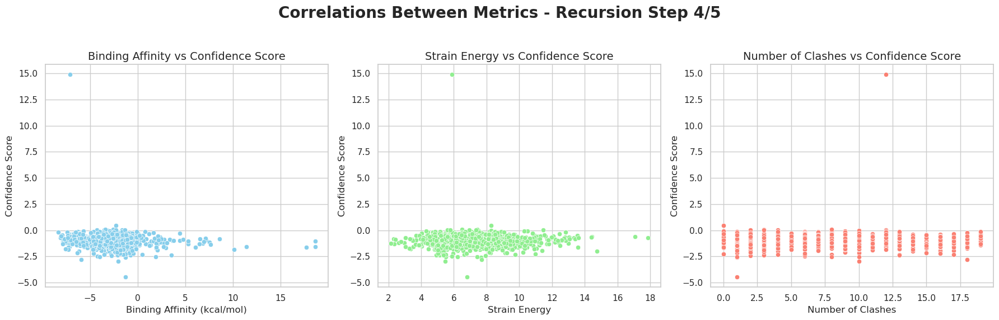

Total number of data points for recursion step 5/5: 673


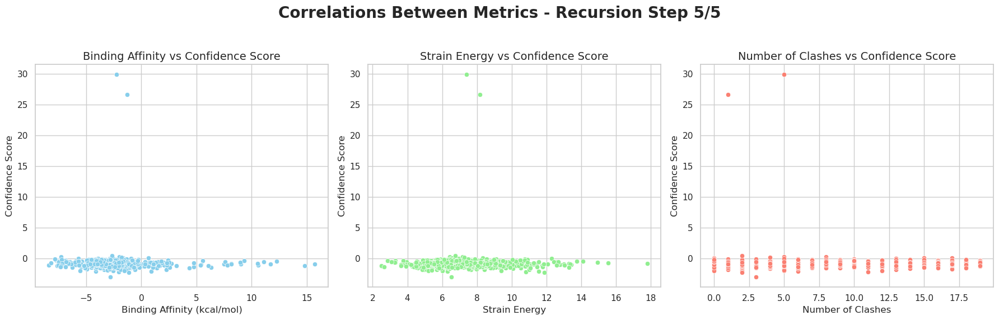

In [6]:
def plot_correlations(data, title_suffix):
    # Plotting correlations for the specified pairs of metrics
    fig, axes = plt.subplots(1, 3, figsize=(18, 6))
    fig.suptitle(f'Correlations Between Metrics - {title_suffix}', fontsize=20, fontweight='bold')

    # Binding Affinity (kcal/mol) vs Confidence Score
    sns.scatterplot(data=data, x='Binding Affinity (kcal/mol)', y='Confidence Score', ax=axes[0], color='skyblue')
    axes[0].set_title('Binding Affinity vs Confidence Score', fontsize=14)
    axes[0].set_xlabel('Binding Affinity (kcal/mol)', fontsize=12)
    axes[0].set_ylabel('Confidence Score', fontsize=12)

    # Strain Energy vs Confidence Score
    sns.scatterplot(data=data, x='Strain Energy', y='Confidence Score', ax=axes[1], color='lightgreen')
    axes[1].set_title('Strain Energy vs Confidence Score', fontsize=14)
    axes[1].set_xlabel('Strain Energy', fontsize=12)
    axes[1].set_ylabel('Confidence Score', fontsize=12)

    # Number of clashes vs Confidence Score
    sns.scatterplot(data=data, x='Number of clashes', y='Confidence Score', ax=axes[2], color='salmon')
    axes[2].set_title('Number of Clashes vs Confidence Score', fontsize=14)
    axes[2].set_xlabel('Number of Clashes', fontsize=12)
    axes[2].set_ylabel('Confidence Score', fontsize=12)

    plt.tight_layout(rect=[0, 0.03, 1, 0.95])
    plt.show()



# Loop over the recursion steps and plot correlations for each step
for step in range(1, 6):
    file_path = f'{base_dir}{output_filename_pattern.format(step)}'
    data = pd.read_csv(file_path)
    num_rows = data.shape[0]  
    print(f'Total number of data points for recursion step {step}/5: {num_rows}')
    plot_correlations(data, f'Recursion Step {step}/5')


## Correlation Between Confidence Score vs Physical Scores (Binding Affinity, Strain Energy, Number of Clashes) 

- This is all data with selecting range values

Total number of data points for recursion step 1/5: 63110


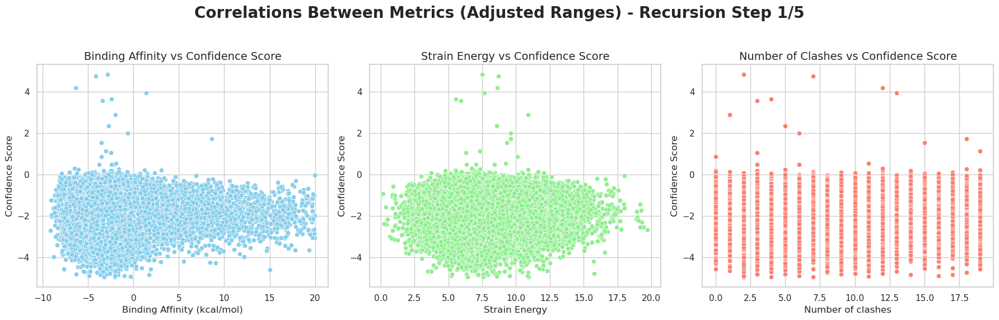

Total number of data points for recursion step 2/5: 4585


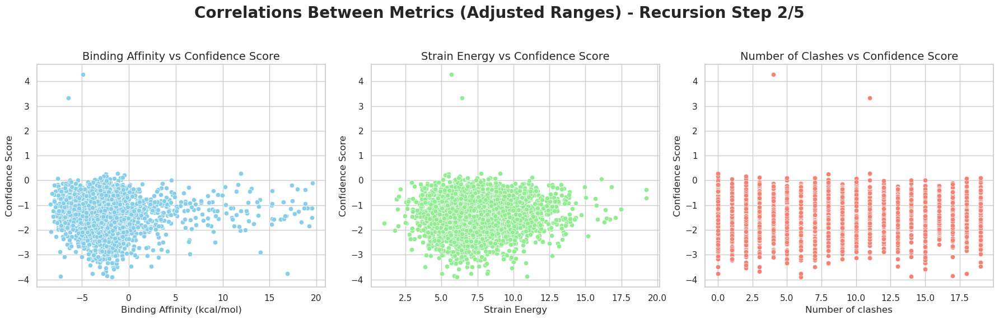

Total number of data points for recursion step 3/5: 1819


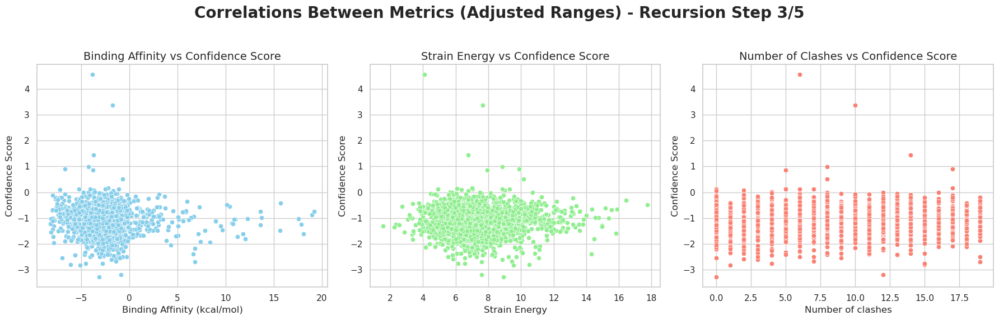

Total number of data points for recursion step 4/5: 1029


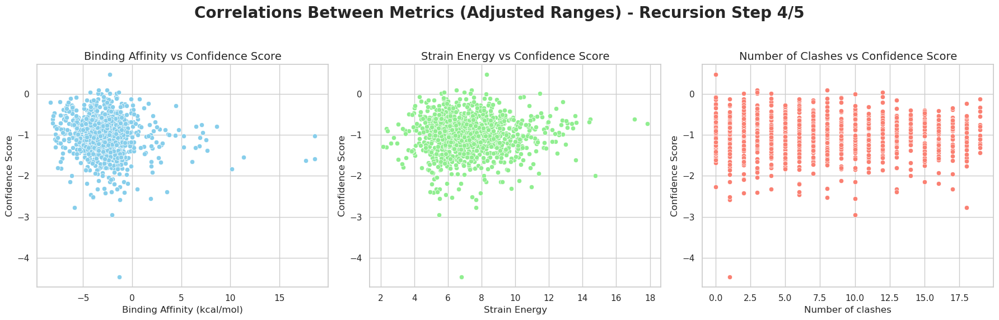

Total number of data points for recursion step 5/5: 673


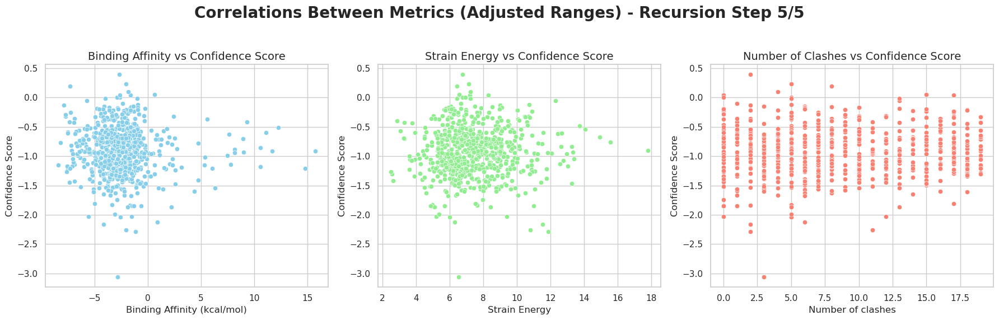

In [7]:

def filter_and_plot_correlations(data, title_suffix):
    # Filter the data for the given ranges
    filtered_data = data[
        (data['Confidence Score'] >= -5) & (data['Confidence Score'] <= 5) &
        (data['Binding Affinity (kcal/mol)'] >= -20) & (data['Binding Affinity (kcal/mol)'] <= 20) &
        (data['Strain Energy'] >= -20) & (data['Strain Energy'] <= 20)
    ]

    # Plotting correlations for the specified pairs of metrics with all adjusted ranges
    fig, axes = plt.subplots(1, 3, figsize=(18, 6))
    fig.suptitle(f'Correlations Between Metrics (Adjusted Ranges) - {title_suffix}', fontsize=20, fontweight='bold')

    # Binding Affinity (kcal/mol) vs Confidence Score
    sns.scatterplot(data=filtered_data, x='Binding Affinity (kcal/mol)', y='Confidence Score', ax=axes[0], color='skyblue')
    axes[0].set_title('Binding Affinity vs Confidence Score', fontsize=14)

    # Strain Energy vs Confidence Score
    sns.scatterplot(data=filtered_data, x='Strain Energy', y='Confidence Score', ax=axes[1], color='lightgreen')
    axes[1].set_title('Strain Energy vs Confidence Score', fontsize=14)

    # Number of clashes vs Confidence Score
    sns.scatterplot(data=filtered_data, x='Number of clashes', y='Confidence Score', ax=axes[2], color='salmon')
    axes[2].set_title('Number of Clashes vs Confidence Score', fontsize=14)

    plt.tight_layout(rect=[0, 0.03, 1, 0.95])
    plt.show()



# Loop over the recursion steps and apply the filter and plotting function
for step in range(1, 6):
    file_path = f'{base_dir}{output_filename_pattern.format(step)}'
    data = pd.read_csv(file_path)
    num_rows = data.shape[0]  
    print(f'Total number of data points for recursion step {step}/5: {num_rows}')
    filter_and_plot_correlations(data, f'Recursion Step {step}/5')


## Correlation Between Confidence Score vs Physical Scores (Binding Affinity, Strain Energy, Number of Clashes) 

- This is all data with selecting range values 
- Best lines with `R^2` values

Total number of data points for recursion step 1/5: 63110


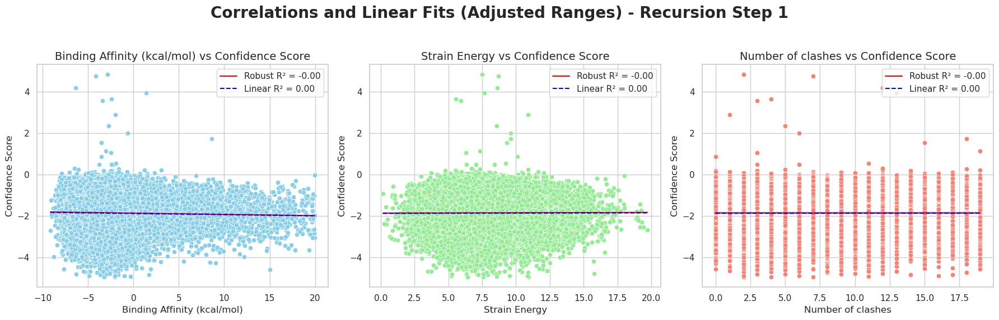

Total number of data points for recursion step 2/5: 4585


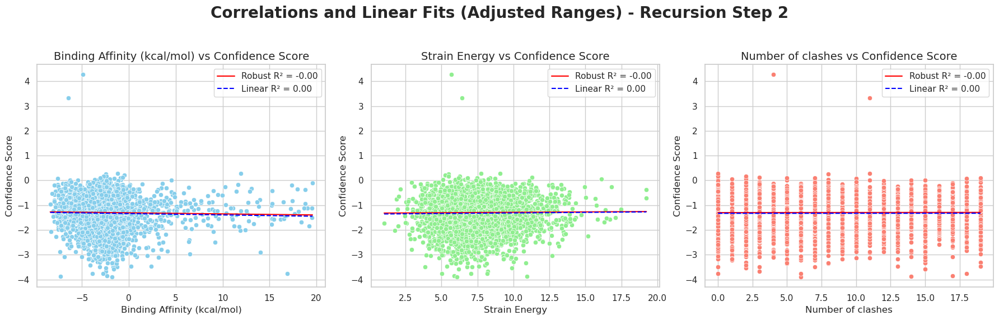

Total number of data points for recursion step 3/5: 1819


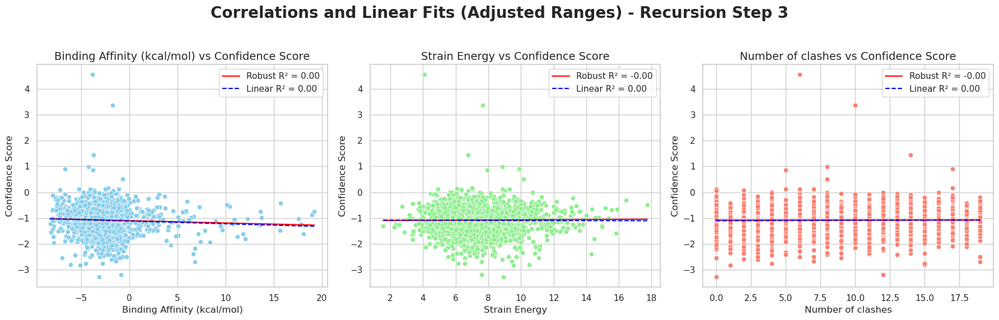

Total number of data points for recursion step 4/5: 1029


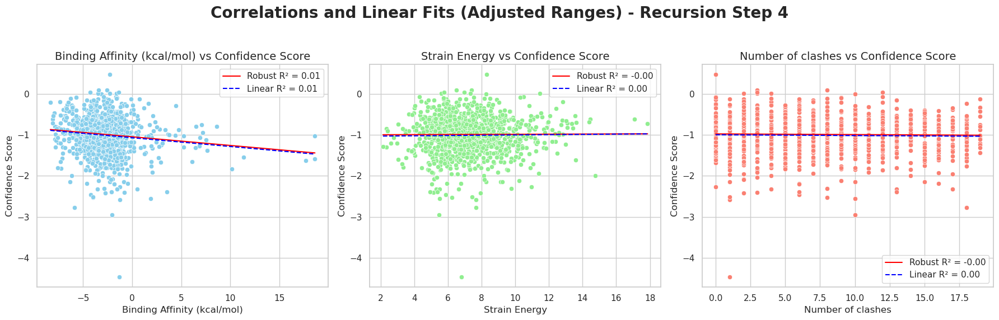

Total number of data points for recursion step 5/5: 673


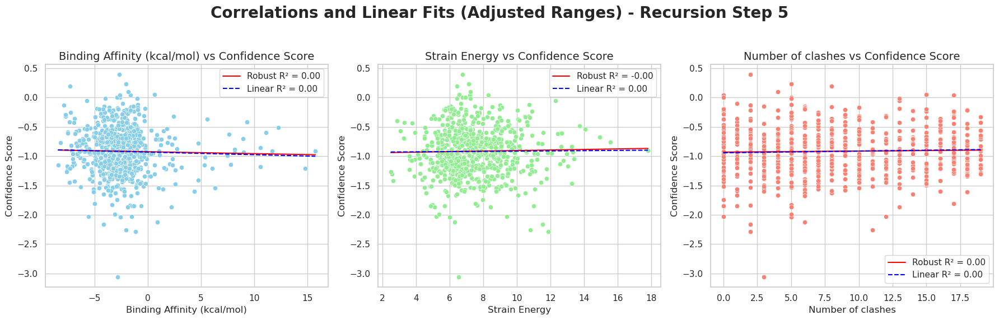

In [8]:
import pandas as pd
import numpy as np
import seaborn as sns
import matplotlib.pyplot as plt
from sklearn.metrics import r2_score
import statsmodels.api as sm

def plot_correlation_with_fit(data, recursion_step):
    # Filter data based on the specified ranges
    filtered_data = data[
        (data['Confidence Score'] >= -5) & (data['Confidence Score'] <= 5) &
        (data['Binding Affinity (kcal/mol)'] >= -20) & (data['Binding Affinity (kcal/mol)'] <= 20) &
        (data['Strain Energy'] >= -20) & (data['Strain Energy'] <= 20)
    ]

    # Preparing the figure
    fig, axes = plt.subplots(1, 3, figsize=(18, 6))
    fig.suptitle(f'Correlations and Linear Fits (Adjusted Ranges) - Recursion Step {recursion_step}', fontsize=20, fontweight='bold')

    # Defining metrics pairs for correlation
    metrics_pairs = [
        ('Binding Affinity (kcal/mol)', 'Confidence Score'),
        ('Strain Energy', 'Confidence Score'),
        ('Number of clashes', 'Confidence Score')
    ]

    colors = ['skyblue', 'lightgreen', 'salmon']

    for i, (x_metric, y_metric) in enumerate(metrics_pairs):
        # Scatter plot
        sns.scatterplot(data=filtered_data, x=x_metric, y=y_metric, ax=axes[i], color=colors[i])
        
        # Robust linear model
        X = sm.add_constant(filtered_data[x_metric])  # Adding a constant for the intercept
        robust_model = sm.RLM(filtered_data[y_metric], X, M=sm.robust.norms.HuberT())
        robust_results = robust_model.fit()
        
        # Calculate R^2 score for robust model
        y_pred_robust = robust_results.predict(X)
        r2_robust = r2_score(filtered_data[y_metric], y_pred_robust)
        
        # Linear model
        coef = np.polyfit(filtered_data[x_metric], filtered_data[y_metric], 1)
        poly1d_fn = np.poly1d(coef) 
        
        # Calculate R^2 score for linear model
        y_pred_linear = poly1d_fn(filtered_data[x_metric])
        r2_linear = r2_score(filtered_data[y_metric], y_pred_linear)
        
        # Plot robust fit and linear fit
        sns.lineplot(x=filtered_data[x_metric], y=y_pred_robust, ax=axes[i], color='red', label=f'Robust R² = {r2_robust:.2f}')
        sns.lineplot(x=filtered_data[x_metric], y=poly1d_fn(filtered_data[x_metric]), ax=axes[i], color='blue', label=f'Linear R² = {r2_linear:.2f}', linestyle='--')
        
        axes[i].set_title(f'{x_metric} vs {y_metric}', fontsize=14)
        axes[i].set_xlabel(x_metric, fontsize=12)
        axes[i].set_ylabel(y_metric, fontsize=12)
        axes[i].legend()

    plt.tight_layout(rect=[0, 0.03, 1, 0.95])
    plt.show()

# Loop over the recursion steps and plot for each step
for step in range(1, 6):
    file_path = f'{base_dir}{output_filename_pattern.format(step)}'
    data = pd.read_csv(file_path)
    num_rows = data.shape[0]  
    print(f'Total number of data points for recursion step {step}/5: {num_rows}')
    plot_correlation_with_fit(data, step)


## Comparison of Same Size Recursived Proteins

Now we are comparising the the Proteins which completed 5/5 Recursion step. First we seperate the results in `Recursion Step Done` values. Each `csv` file must be same number of `Protein ID`!

In [9]:
def filter_data_for_recursion_step(recursion_step, base_dir, filtered_proteins_file, summary_file_template, output_file_template):
    # Load the file with filtered Protein IDs
    filtered_proteins_df = pd.read_csv(filtered_proteins_file)
    filtered_proteins = filtered_proteins_df['Protein ID']
    
    # Format the file name for the current recursion step
    summary_file_path = summary_file_template.format(recursion_step)
    
    # Load the summary data for the current recursion step
    summary_data = pd.read_csv(summary_file_path)

    filtered_data = data[
        (data['Recursion Step Done'] == recursion_step) &
        (data['Binding Affinity (kcal/mol)'] < 20) &
        (data['Number of clashes'] < 20) &
        (data['Strain Energy'] < 20) &
        (data['Confidence Score'] > -10)
    ]
    
    # Filter the summary data for the current recursion step
    filtered_summary_new = summary_data[summary_data['Protein ID'].isin(filtered_proteins) & 
        (summary_data['Recursion Step Done'] == f'{recursion_step}/5') & 
        (summary_data['Binding Affinity (kcal/mol)'] < 20) &
        (summary_data['Number of clashes'] < 20) &
        (summary_data['Strain Energy'] < 20) &
        (summary_data['Confidence Score'] > -10)
        
        ]
    
    # Save the filtered data to a new CSV file
    output_file_path = output_file_template.format(recursion_step)
    filtered_summary_new.to_csv(output_file_path, index=False)
    
    print(f"Filtered data for recursion step {recursion_step}/5 saved to: {output_file_path}")

# Base directory and file patterns
base_dir = '/fast/AG_Akalin/asarigun/Arcas_Stage_1/ROOF/COMPASS/experiments/HURI/data/'
filtered_proteins_file = base_dir + 'filtered_summary_new_rec_5.csv'
summary_file_template = base_dir + 'summary_new.csv' 
output_file_template = base_dir + 'filtered_proteins_from_summary_rec{}.csv'

# Loop through each recursion step
for step in range(1, 6):
    filter_data_for_recursion_step(step, base_dir, filtered_proteins_file, summary_file_template, output_file_template)


Filtered data for recursion step 1/5 saved to: /fast/AG_Akalin/asarigun/Arcas_Stage_1/ROOF/COMPASS/experiments/HURI/data/filtered_proteins_from_summary_rec1.csv
Filtered data for recursion step 2/5 saved to: /fast/AG_Akalin/asarigun/Arcas_Stage_1/ROOF/COMPASS/experiments/HURI/data/filtered_proteins_from_summary_rec2.csv
Filtered data for recursion step 3/5 saved to: /fast/AG_Akalin/asarigun/Arcas_Stage_1/ROOF/COMPASS/experiments/HURI/data/filtered_proteins_from_summary_rec3.csv
Filtered data for recursion step 4/5 saved to: /fast/AG_Akalin/asarigun/Arcas_Stage_1/ROOF/COMPASS/experiments/HURI/data/filtered_proteins_from_summary_rec4.csv
Filtered data for recursion step 5/5 saved to: /fast/AG_Akalin/asarigun/Arcas_Stage_1/ROOF/COMPASS/experiments/HURI/data/filtered_proteins_from_summary_rec5.csv


## Read Each Seperated Files (Each Shows Recursion Steps)

In [10]:
# Loop over the recursion steps and read each file
for step in range(1, 6):
    file_path = f'{output_file_template.format(step)}'
    data = pd.read_csv(file_path)
    num_rows = data.shape[0]  
    print(f'Total number of data points for recursion step {step}/5: {num_rows}')
    print(f'First few rows of the dataframe for recursion step {step}/5:')
    display(data.head())

Total number of data points for recursion step 1/5: 302
First few rows of the dataframe for recursion step 1/5:


,Protein ID,Recursion Step Done,Ligand Description,Binding Affinity (kcal/mol),Number of clashes,Strain Energy,Confidence Score,Rank of sdf,_timestamp,_runtime,_step
0,ENSG00000160207-ENSG00000164649_ENSG00000160207,1/5,NaN,-2.571109,7.0,4.878880,-0.94,rank1_confidence-0.94,1.712295e+09,48.260556,8
1,ENSG00000099377-ENSG00000198881_ENSG00000099377,1/5,NaN,-5.570218,10.0,8.841543,-0.64,rank1_confidence-0.64,1.712216e+09,23.535098,8
2,ENSG00000160999-ENSG00000179335_ENSG00000179335,1/5,NaN,-7.917760,3.0,6.285917,0.05,rank1_confidence0.05,1.712553e+09,471.765201,8
3,ENSG00000136273-ENSG00000155974_ENSG00000155974,1/5,NaN,-6.551131,4.0,6.955869,-0.59,rank1_confidence-0.59,1.712539e+09,390.317934,8
4,ENSG00000075420-ENSG00000106077_ENSG00000075420,1/5,NaN,-3.445306,4.0,5.710754,-1.09,rank1_confidence-1.09,1.712389e+09,241.988915,8


Total number of data points for recursion step 2/5: 290
First few rows of the dataframe for recursion step 2/5:


,Protein ID,Recursion Step Done,Ligand Description,Binding Affinity (kcal/mol),Number of clashes,Strain Energy,Confidence Score,Rank of sdf,_timestamp,_runtime,_step
0,ENSG00000161011-ENSG00000170296_ENSG00000170296,2/5,/fast/AG_Akalin/asarigun/Arcas_Stage_1/ROOF/FA...,-3.777976,7.0,7.468762,-1.02,rank1_confidence-1.02,1.712559e+09,453.857196,8
1,ENSG00000087076-ENSG00000087076_ENSG00000087076,2/5,/fast/AG_Akalin/asarigun/Arcas_Stage_1/FACTORY...,-7.105160,6.0,9.124105,-0.97,rank1_confidence-0.97,1.712168e+09,23.370705,8
2,ENSG00000124074-ENSG00000185681_ENSG00000185681,2/5,/fast/AG_Akalin/asarigun/Arcas_Stage_1/FACTORY...,-3.760656,11.0,5.056110,-1.27,rank1_confidence-1.27,1.712130e+09,22.177307,8
3,ENSG00000136536-ENSG00000160207_ENSG00000160207,2/5,/fast/AG_Akalin/asarigun/Arcas_Stage_1/ROOF/FA...,-2.197282,8.0,10.829867,-0.56,rank1_confidence-0.56,1.712299e+09,77.270777,8
4,ENSG00000135457-ENSG00000171703_ENSG00000135457,2/5,/fast/AG_Akalin/asarigun/Arcas_Stage_1/ROOF/FA...,-4.371279,7.0,13.315138,-0.18,rank1_confidence-0.18,1.712344e+09,64.000124,8


Total number of data points for recursion step 3/5: 295
First few rows of the dataframe for recursion step 3/5:


,Protein ID,Recursion Step Done,Ligand Description,Binding Affinity (kcal/mol),Number of clashes,Strain Energy,Confidence Score,Rank of sdf,_timestamp,_runtime,_step
0,ENSG00000173281-ENSG00000186298_ENSG00000186298,3/5,/fast/AG_Akalin/asarigun/Arcas_Stage_1/ROOF/FA...,-4.800523,7.0,6.511097,-0.71,rank1_confidence-0.71,1.712397e+09,171.491014,8
1,ENSG00000100055-ENSG00000125740_ENSG00000125740,3/5,/fast/AG_Akalin/asarigun/Arcas_Stage_1/FACTORY...,-1.756785,3.0,8.469964,-0.58,rank1_confidence-0.58,1.712223e+09,15.972999,8
2,ENSG00000158457-ENSG00000164620_ENSG00000164620,3/5,/fast/AG_Akalin/asarigun/Arcas_Stage_1/ROOF/FA...,-2.672476,7.0,4.788666,-0.73,rank1_confidence-0.73,1.713150e+09,37.398604,8
3,ENSG00000147813-ENSG00000204371_ENSG00000204371,3/5,/fast/AG_Akalin/asarigun/Arcas_Stage_1/ROOF/FA...,-6.380187,8.0,10.186976,-0.71,rank1_confidence-0.71,1.713146e+09,56.470893,8
4,ENSG00000087076-ENSG00000169914_ENSG00000087076,3/5,/fast/AG_Akalin/asarigun/Arcas_Stage_1/FACTORY...,-6.564564,7.0,4.127832,-0.65,rank1_confidence-0.65,1.712168e+09,19.717813,8


Total number of data points for recursion step 4/5: 275
First few rows of the dataframe for recursion step 4/5:


,Protein ID,Recursion Step Done,Ligand Description,Binding Affinity (kcal/mol),Number of clashes,Strain Energy,Confidence Score,Rank of sdf,_timestamp,_runtime,_step
0,ENSG00000100151-ENSG00000234616_ENSG00000100151,4/5,/fast/AG_Akalin/asarigun/Arcas_Stage_1/ROOF/FA...,-5.409276,10.0,8.264241,-0.75,rank1_confidence-0.75,1.712816e+09,706.876655,8
1,ENSG00000147465-ENSG00000184210_ENSG00000184210,4/5,/fast/AG_Akalin/asarigun/Arcas_Stage_1/ROOF/FA...,-4.909438,0.0,5.242632,-1.34,rank1_confidence-1.34,1.712298e+09,40.284136,8
2,ENSG00000136273-ENSG00000155974_ENSG00000155974,4/5,/fast/AG_Akalin/asarigun/Arcas_Stage_1/ROOF/FA...,-6.446728,4.0,5.868707,-0.72,rank1_confidence-0.72,1.712540e+09,395.072622,8
3,ENSG00000087589-ENSG00000160207_ENSG00000160207,4/5,/fast/AG_Akalin/asarigun/Arcas_Stage_1/FACTORY...,-1.573245,3.0,6.808896,-0.89,rank1_confidence-0.89,1.712175e+09,30.105636,8
4,ENSG00000123562-ENSG00000185811_ENSG00000123562,4/5,/fast/AG_Akalin/asarigun/Arcas_Stage_1/FACTORY...,-4.027759,11.0,6.031885,-0.99,rank1_confidence-0.99,1.712124e+09,14.315375,8


Total number of data points for recursion step 5/5: 673
First few rows of the dataframe for recursion step 5/5:


,Protein ID,Recursion Step Done,Ligand Description,Binding Affinity (kcal/mol),Number of clashes,Strain Energy,Confidence Score,Rank of sdf,_timestamp,_runtime,_step
0,ENSG00000104812-ENSG00000136826_ENSG00000136826,5/5,/fast/AG_Akalin/asarigun/Arcas_Stage_1/ROOF/FA...,-1.687511,16.0,6.511048,-1.42,rank1_confidence-1.42,1.712479e+09,126.156249,8
1,ENSG00000100151-ENSG00000187024_ENSG00000100151,5/5,/fast/AG_Akalin/asarigun/Arcas_Stage_1/ROOF/FA...,-3.735197,17.0,6.073034,-1.29,rank1_confidence-1.29,1.712765e+09,649.880304,8
2,ENSG00000161011-ENSG00000170296_ENSG00000170296,5/5,/fast/AG_Akalin/asarigun/Arcas_Stage_1/ROOF/FA...,-3.705091,1.0,5.819493,-0.99,rank1_confidence-0.99,1.712560e+09,409.957998,8
3,ENSG00000062194-ENSG00000160207_ENSG00000160207,5/5,/fast/AG_Akalin/asarigun/Arcas_Stage_1/FACTORY...,-2.219365,5.0,8.024738,-0.90,rank1_confidence-0.90,1.712018e+09,26.583854,8
4,ENSG00000130518-ENSG00000160014_ENSG00000130518,5/5,/fast/AG_Akalin/asarigun/Arcas_Stage_1/ROOF/FA...,-0.930709,5.0,10.739445,-0.12,rank1_confidence-0.12,1.713119e+09,51.796495,8


## Data Distributions of Each Recursive Step

Total number of data points for recursion step 1/5: 302


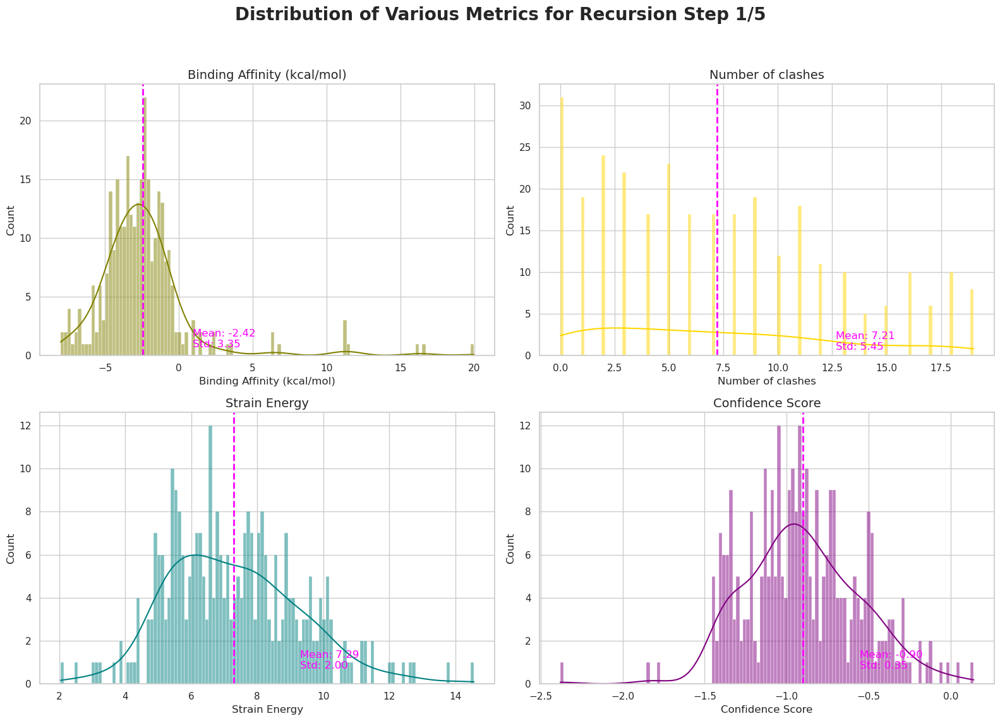

Total number of data points for recursion step 2/5: 290


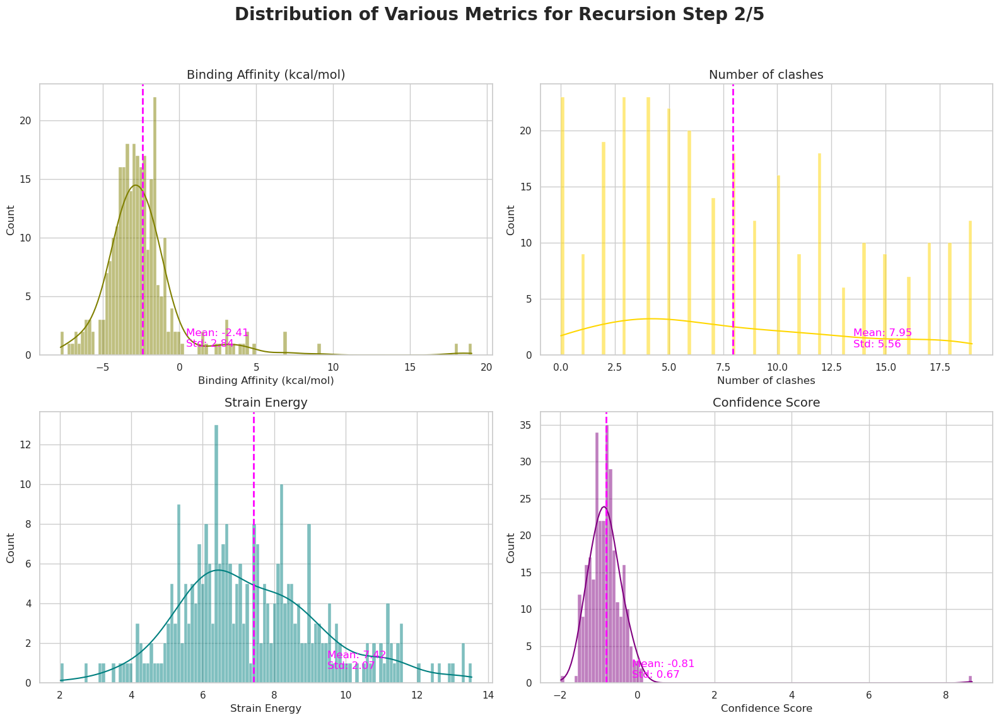

Total number of data points for recursion step 3/5: 295


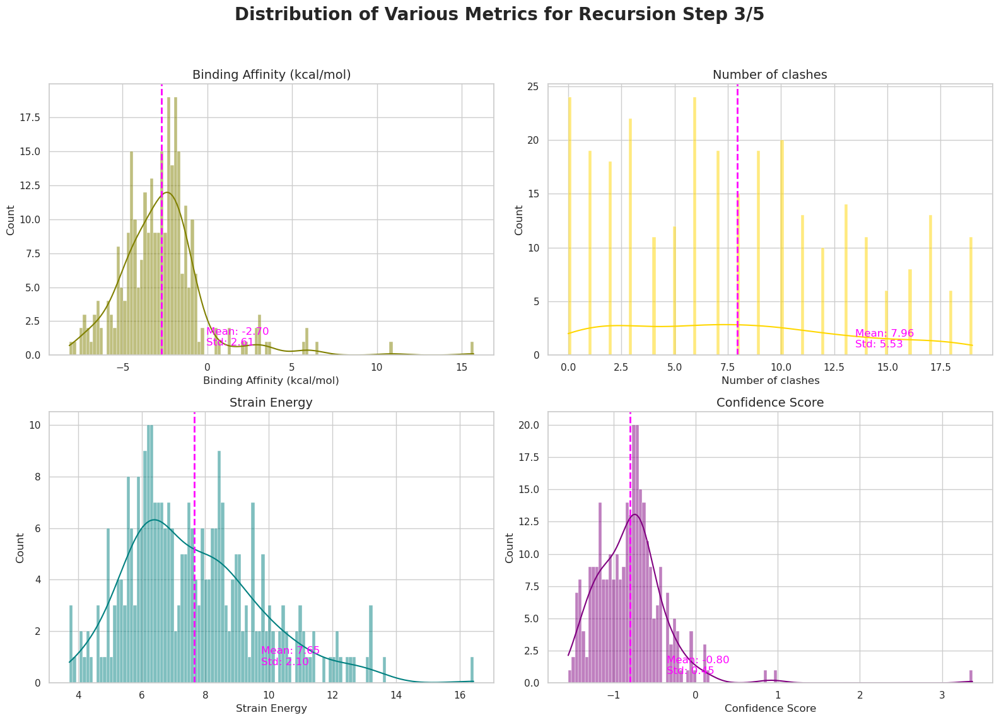

Total number of data points for recursion step 4/5: 275


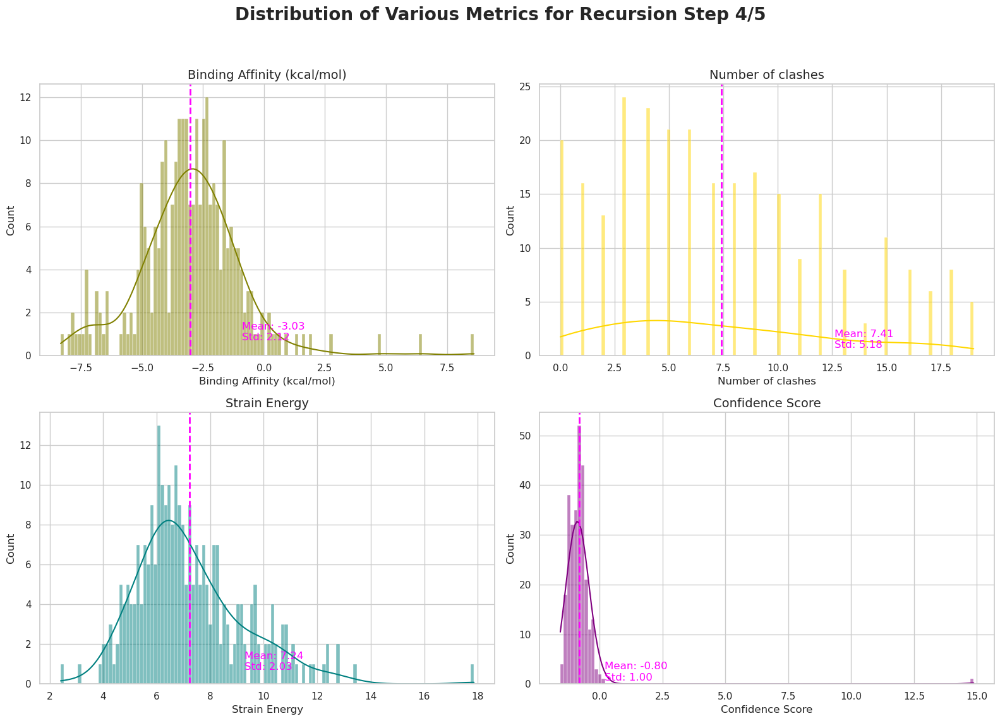

Total number of data points for recursion step 5/5: 673


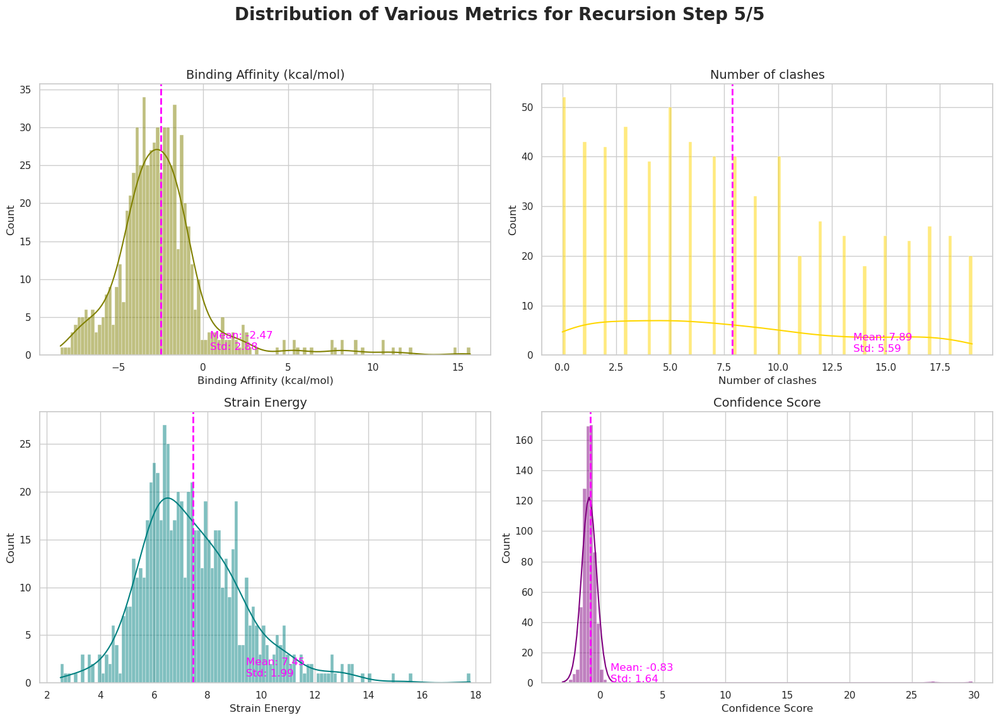

In [11]:
# Function to plot distributions of metrics from a given dataset
def plot_metrics_distributions(data, figure_title):
    # Set the overall aesthetics
    sns.set(style="whitegrid", palette="pastel")

    # Prepare the figure with a larger size for better readability
    fig, axes = plt.subplots(2, 2, figsize=(16, 12))  # Increased figure size for better legibility
    fig.suptitle(figure_title, fontsize=20, fontweight='bold')

    # Define a common bin size for comparable scales
    common_bins = 120  # Example bin size, adjust based on your data distribution

    # List of metrics to plot
    metrics = ['Binding Affinity (kcal/mol)', 'Number of clashes', 'Strain Energy', 'Confidence Score']
    colors = ['olive', 'gold', 'teal', 'purple']

    # Plotting distributions
    for i, metric in enumerate(metrics):
        ax = axes.flat[i]
        sns.histplot(data=data, x=metric, kde=True, ax=ax, color=colors[i], bins=common_bins)
        ax.set_title(metric, fontsize=14)
        ax.grid(True)

        # Calculate mean and std, and annotate on the plots
        mean_value = data[metric].mean()
        std_value = data[metric].std()
        ax.axvline(mean_value, color='magenta', linestyle='dashed', linewidth=2)
        ax.text(mean_value + std_value, 0.7, f'Mean: {mean_value:.2f}\nStd: {std_value:.2f}', color='magenta', ha='left')

    # Adjust layout for a clean look and ensure the titles and labels don't overlap
    plt.tight_layout(rect=[0, 0.03, 1, 0.95])

    # Show plot
    plt.show()


# Loop over the recursion steps and plot for each step
for step in range(1, 6):
    file_path = f'{output_file_template.format(step)}'
    data = pd.read_csv(file_path)
    num_rows = data.shape[0]  
    print(f'Total number of data points for recursion step {step}/5: {num_rows}')
    plot_metrics_distributions(data, f'Distribution of Various Metrics for Recursion Step {step}/5')


## Data Distribution Ranges of Each Recursive Step

Total number of data points for recursion step 1/5: 302


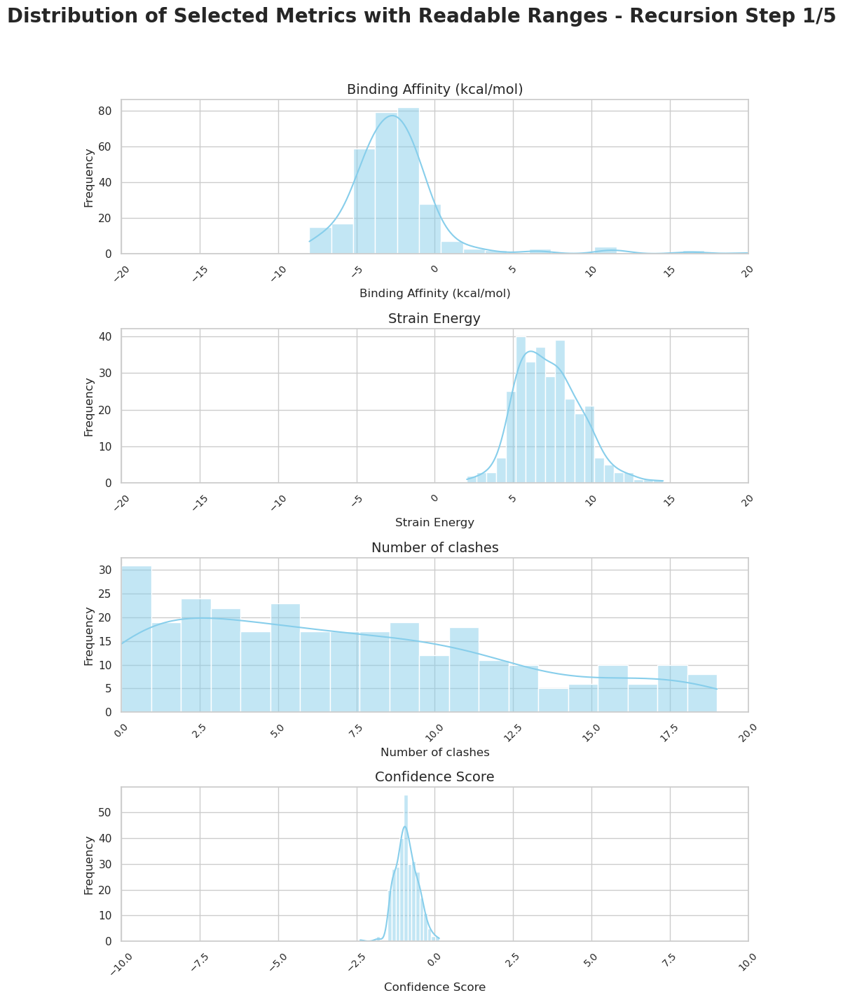

Total number of data points for recursion step 2/5: 290


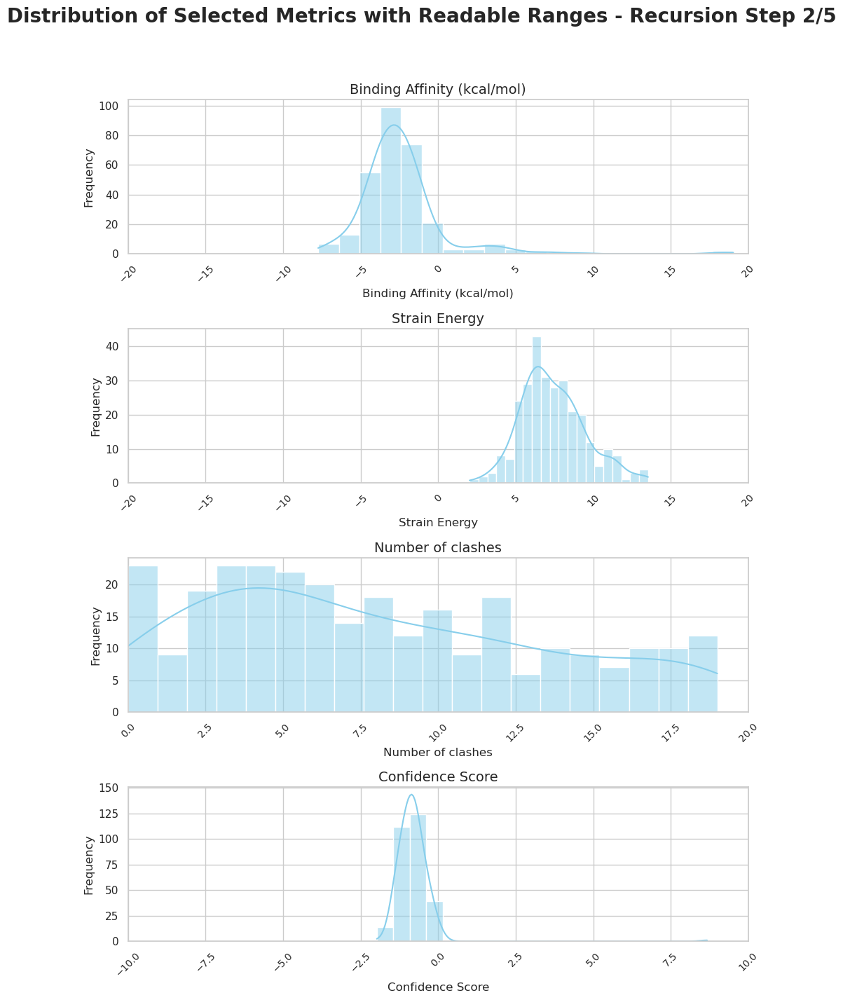

Total number of data points for recursion step 3/5: 295


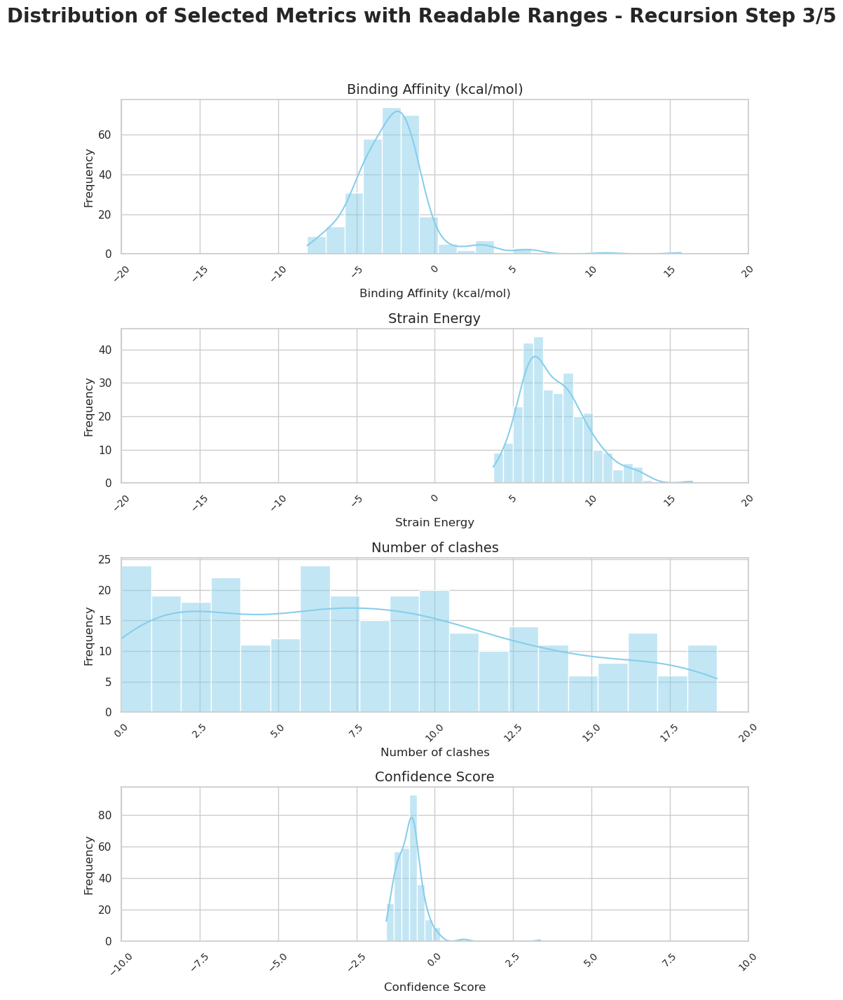

Total number of data points for recursion step 4/5: 275


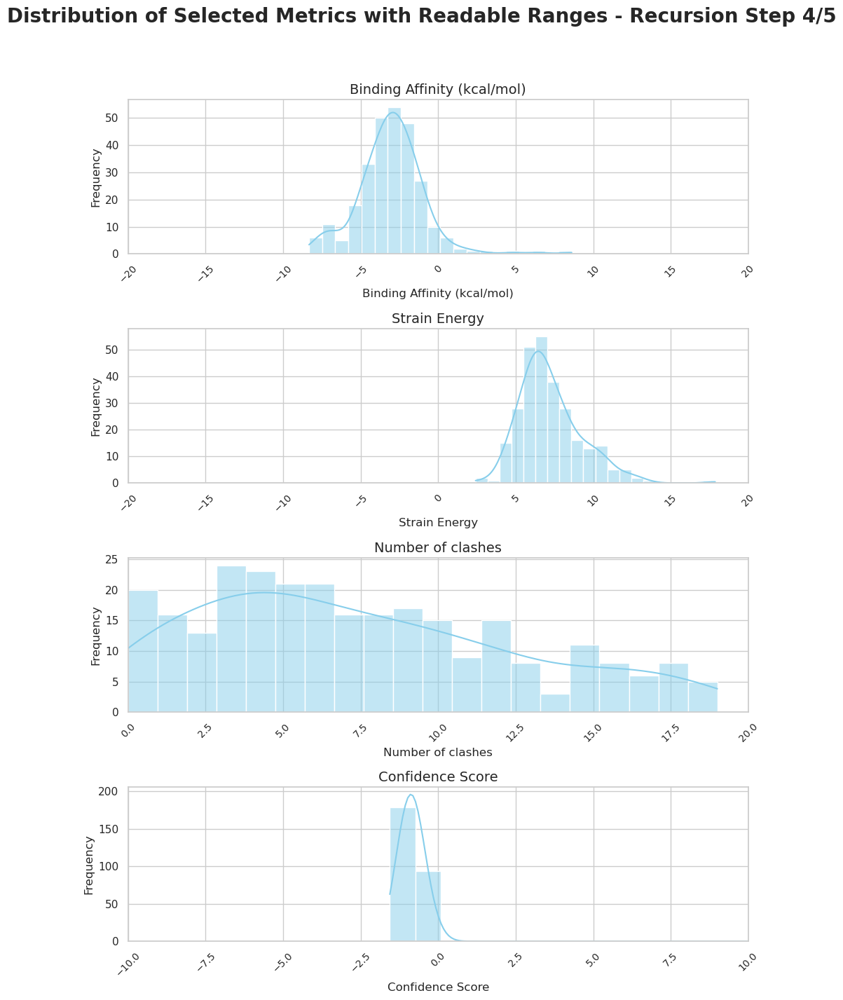

Total number of data points for recursion step 5/5: 673


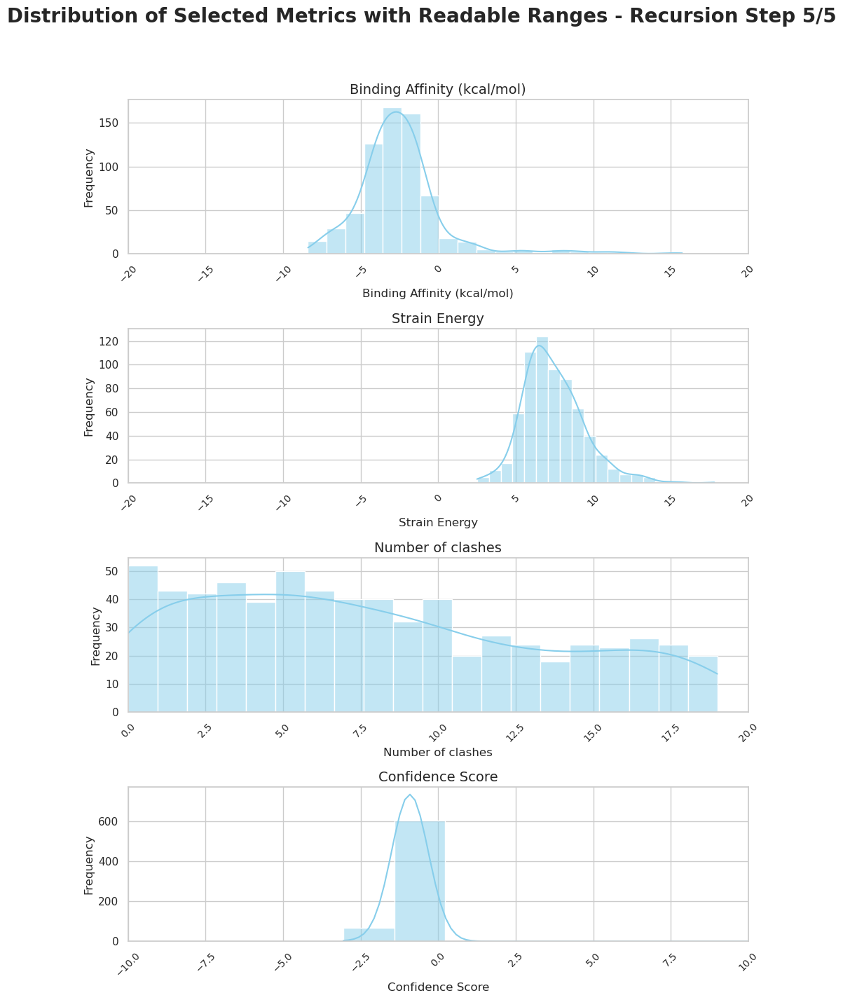

In [12]:
# Function to plot histograms with readable ranges for a given dataset
def plot_histograms_with_readable_ranges(data, title_suffix):
    # Enhancing overall aesthetics
    sns.set(style="whitegrid", palette="pastel")

    # Initializing a larger figure for clearer detail
    fig, axes = plt.subplots(4, 1, figsize=(10, 15))  # Using a vertical layout for better x-axis label readability

    # Titles and customization for improved readability
    fig.suptitle(f'Distribution of Selected Metrics with Readable Ranges - {title_suffix}', fontsize=20, fontweight='bold')

    # Adjusting bin sizes and x-axis limits for clarity
    metrics_info = {
        'Binding Affinity (kcal/mol)': {'bins': 20, 'ax': axes[0], 'xlim': (-20, 20)},
        'Strain Energy': {'bins': 20, 'ax': axes[1], 'xlim': (-20, 20)},
        'Number of clashes': {'bins': 20, 'ax': axes[2], 'xlim': (0, 20)},
        'Confidence Score': {'bins': 20, 'ax': axes[3], 'xlim': (-10, 10)}
    }

    for metric, info in metrics_info.items():
        sns.histplot(data=data, x=metric, kde=True, ax=info['ax'], bins=info['bins'], color='skyblue')
        info['ax'].set_title(metric, fontsize=14)
        info['ax'].set_xlabel(metric, fontsize=12)
        info['ax'].set_ylabel('Frequency', fontsize=12)
        info['ax'].set_xlim(info['xlim'])  # Adjusting x-axis limits for focusing on interesting ranges
        info['ax'].tick_params(axis='x', labelsize=10, rotation=45)

    plt.tight_layout(rect=[0, 0.03, 1, 0.95])
    plt.show()



# Loop over the recursion steps and plot for each step
for step in range(1, 6):
    file_path = f'{output_file_template.format(step)}'
    data = pd.read_csv(file_path)
    num_rows = data.shape[0]  
    print(f'Total number of data points for recursion step {step}/5: {num_rows}')
    plot_histograms_with_readable_ranges(data, f'Recursion Step {step}/5')


## Correlation Between Confidence Score vs Physical Scores (Binding Affinity, Strain Energy, Number of Clashes) of Each Recursive Step

- This is all data without selecting range values

Total number of data points for recursion step 1/5: 302


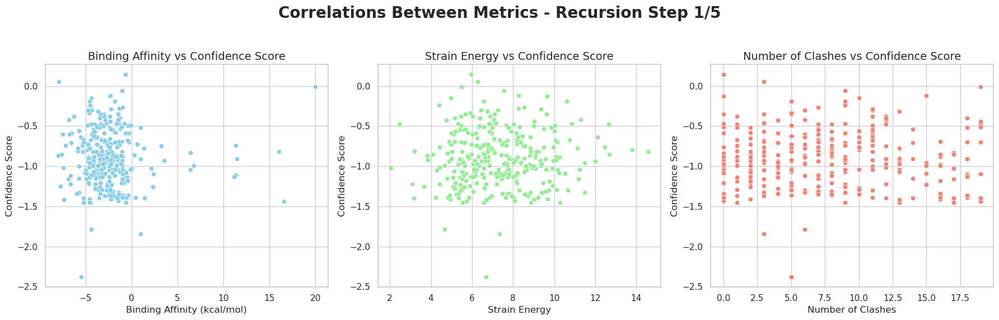

Total number of data points for recursion step 2/5: 290


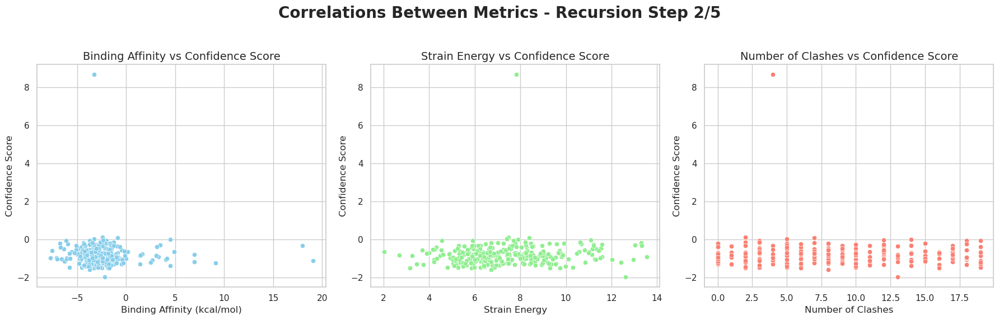

Total number of data points for recursion step 3/5: 295


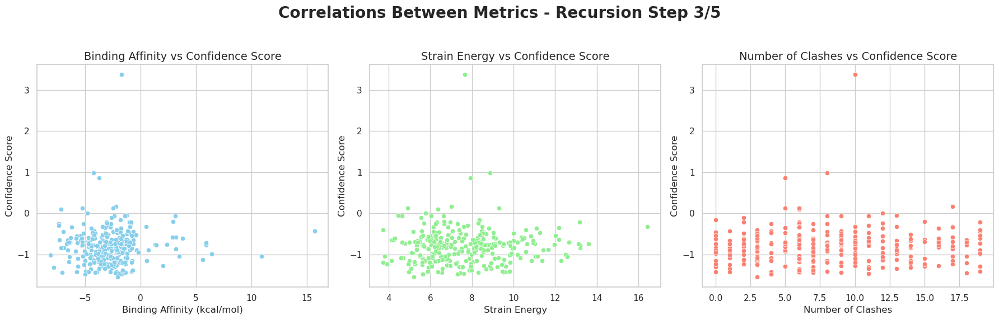

Total number of data points for recursion step 4/5: 275


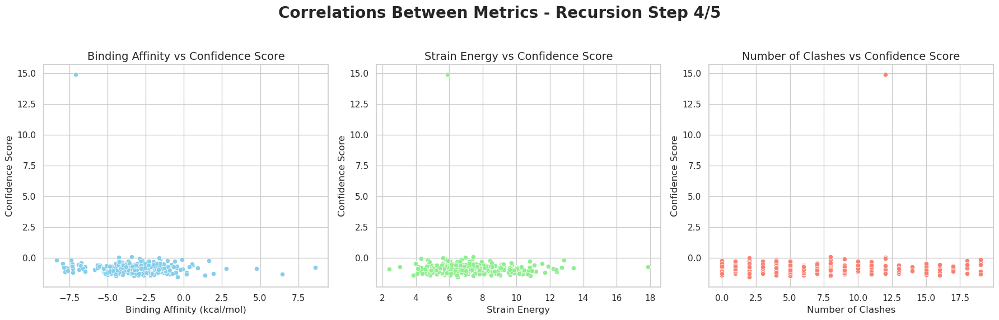

Total number of data points for recursion step 5/5: 673


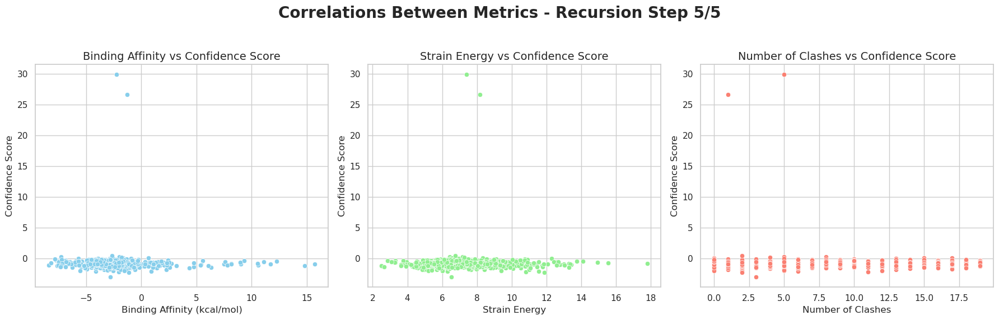

In [13]:
def plot_correlations(data, title_suffix):
    # Plotting correlations for the specified pairs of metrics
    fig, axes = plt.subplots(1, 3, figsize=(18, 6))
    fig.suptitle(f'Correlations Between Metrics - {title_suffix}', fontsize=20, fontweight='bold')

    # Binding Affinity (kcal/mol) vs Confidence Score
    sns.scatterplot(data=data, x='Binding Affinity (kcal/mol)', y='Confidence Score', ax=axes[0], color='skyblue')
    axes[0].set_title('Binding Affinity vs Confidence Score', fontsize=14)
    axes[0].set_xlabel('Binding Affinity (kcal/mol)', fontsize=12)
    axes[0].set_ylabel('Confidence Score', fontsize=12)

    # Strain Energy vs Confidence Score
    sns.scatterplot(data=data, x='Strain Energy', y='Confidence Score', ax=axes[1], color='lightgreen')
    axes[1].set_title('Strain Energy vs Confidence Score', fontsize=14)
    axes[1].set_xlabel('Strain Energy', fontsize=12)
    axes[1].set_ylabel('Confidence Score', fontsize=12)

    # Number of clashes vs Confidence Score
    sns.scatterplot(data=data, x='Number of clashes', y='Confidence Score', ax=axes[2], color='salmon')
    axes[2].set_title('Number of Clashes vs Confidence Score', fontsize=14)
    axes[2].set_xlabel('Number of Clashes', fontsize=12)
    axes[2].set_ylabel('Confidence Score', fontsize=12)

    plt.tight_layout(rect=[0, 0.03, 1, 0.95])
    plt.show()



# Loop over the recursion steps and plot correlations for each step
for step in range(1, 6):
    file_path = f'{output_file_template.format(step)}'
    data = pd.read_csv(file_path)
    num_rows = data.shape[0]  
    print(f'Total number of data points for recursion step {step}/5: {num_rows}')
    plot_correlations(data, f'Recursion Step {step}/5')


## Correlation Between Confidence Score vs Physical Scores (Binding Affinity, Strain Energy, Number of Clashes) of Each Recursive Step

- This is all data with selecting range values

Total number of data points for recursion step 1/5: 302


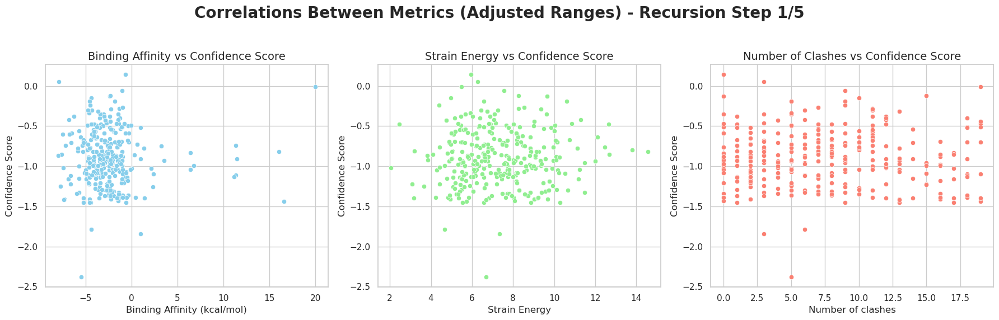

Total number of data points for recursion step 2/5: 290


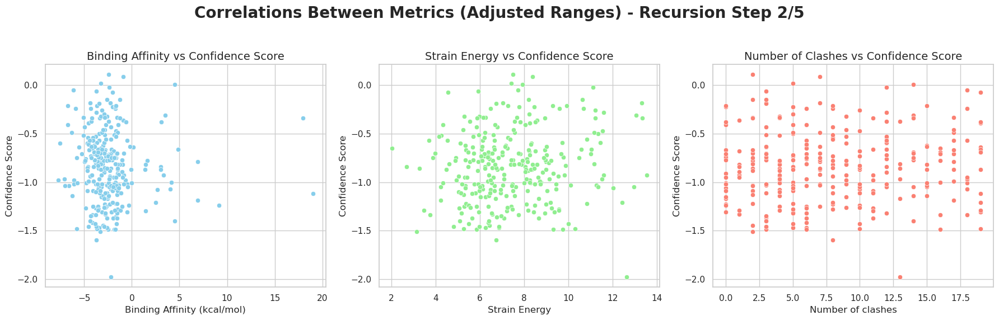

Total number of data points for recursion step 3/5: 295


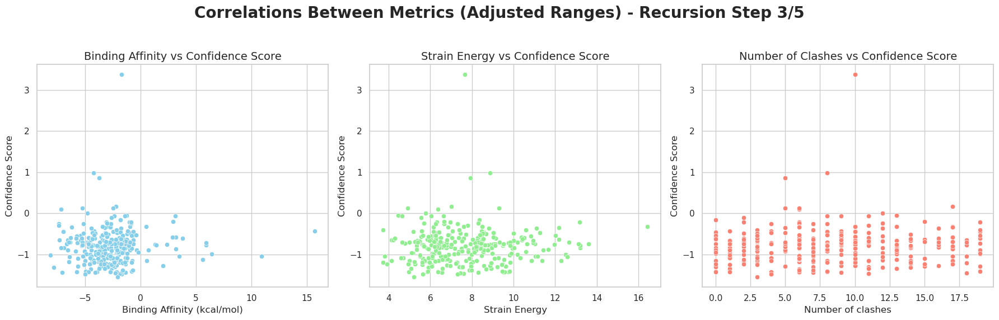

Total number of data points for recursion step 4/5: 275


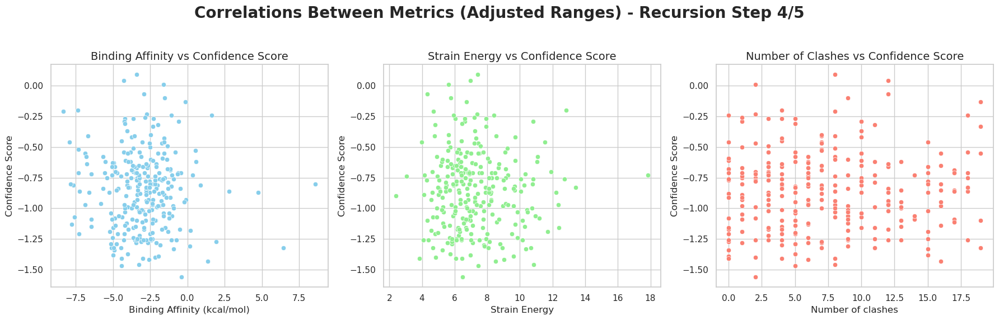

Total number of data points for recursion step 5/5: 673


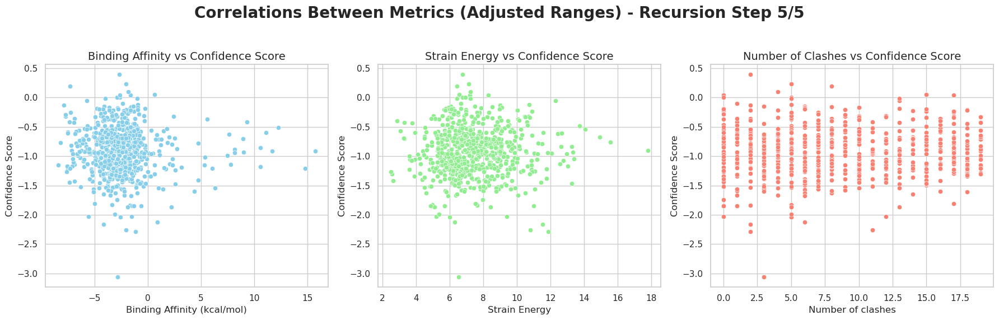

In [14]:
def filter_and_plot_correlations(data, title_suffix):
    # Filter the data for the given ranges
    filtered_data = data[
        (data['Confidence Score'] >= -5) & (data['Confidence Score'] <= 5) &
        (data['Binding Affinity (kcal/mol)'] >= -20) & (data['Binding Affinity (kcal/mol)'] <= 20) &
        (data['Strain Energy'] >= -20) & (data['Strain Energy'] <= 20)
    ]

    # Plotting correlations for the specified pairs of metrics with all adjusted ranges
    fig, axes = plt.subplots(1, 3, figsize=(18, 6))
    fig.suptitle(f'Correlations Between Metrics (Adjusted Ranges) - {title_suffix}', fontsize=20, fontweight='bold')

    # Binding Affinity (kcal/mol) vs Confidence Score
    sns.scatterplot(data=filtered_data, x='Binding Affinity (kcal/mol)', y='Confidence Score', ax=axes[0], color='skyblue')
    axes[0].set_title('Binding Affinity vs Confidence Score', fontsize=14)

    # Strain Energy vs Confidence Score
    sns.scatterplot(data=filtered_data, x='Strain Energy', y='Confidence Score', ax=axes[1], color='lightgreen')
    axes[1].set_title('Strain Energy vs Confidence Score', fontsize=14)

    # Number of clashes vs Confidence Score
    sns.scatterplot(data=filtered_data, x='Number of clashes', y='Confidence Score', ax=axes[2], color='salmon')
    axes[2].set_title('Number of Clashes vs Confidence Score', fontsize=14)

    plt.tight_layout(rect=[0, 0.03, 1, 0.95])
    plt.show()



# Loop over the recursion steps and apply the filter and plotting function
for step in range(1, 6):
    file_path = f'{output_file_template.format(step)}'
    data = pd.read_csv(file_path)
    num_rows = data.shape[0]  
    print(f'Total number of data points for recursion step {step}/5: {num_rows}')
    filter_and_plot_correlations(data, f'Recursion Step {step}/5')


## Correlation Between Confidence Score vs Physical Scores (Binding Affinity, Strain Energy, Number of Clashes) of Each Recursive Step

- This is all data with selecting range values 
- Best lines with `R^2` values

Total number of data points for recursion step 1/5: 302


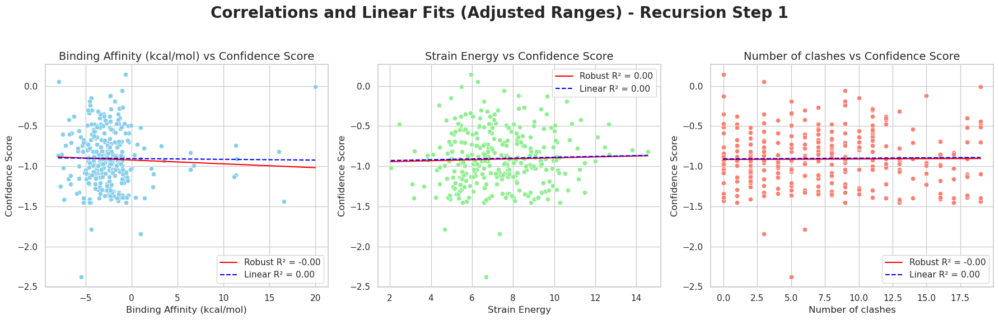

Total number of data points for recursion step 2/5: 290


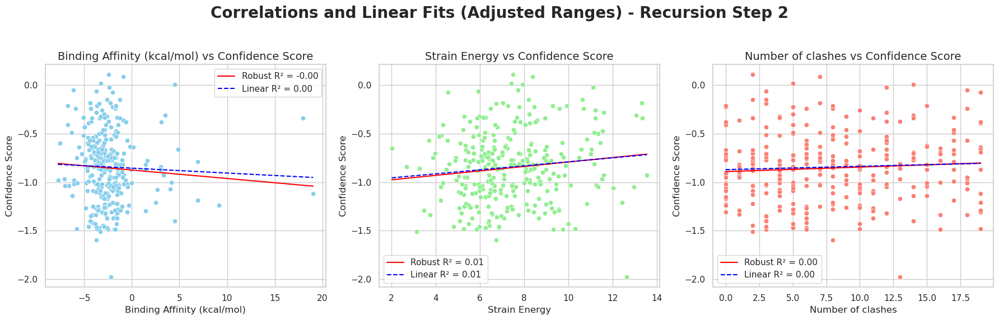

Total number of data points for recursion step 3/5: 295


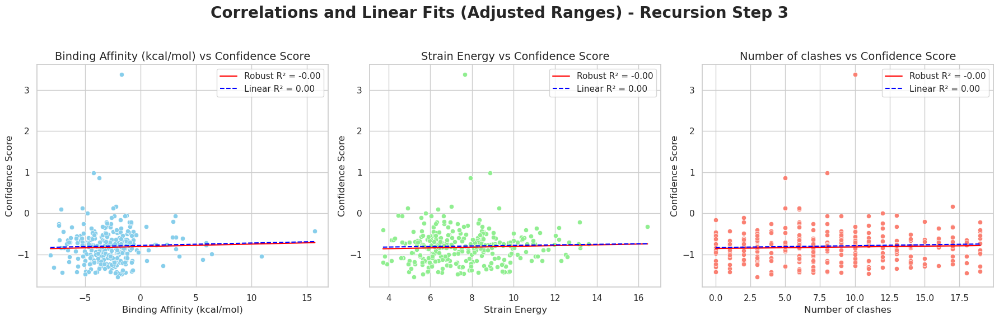

Total number of data points for recursion step 4/5: 275


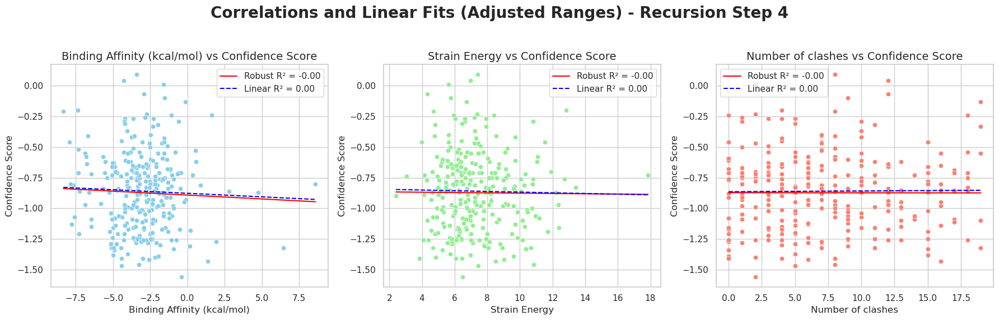

Total number of data points for recursion step 5/5: 673


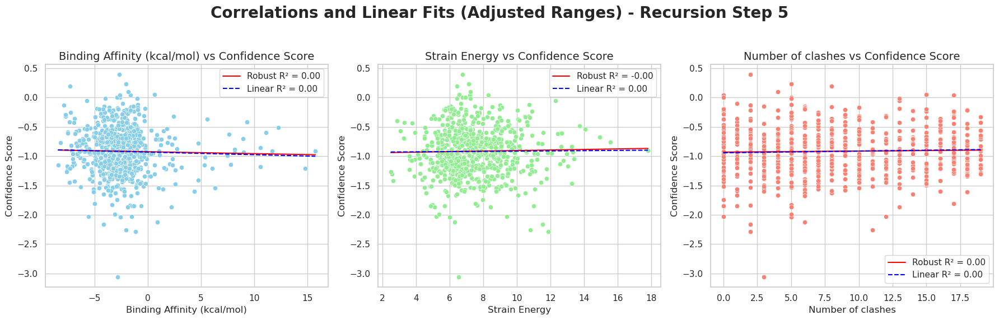

In [15]:
import pandas as pd
import numpy as np
import seaborn as sns
import matplotlib.pyplot as plt
from sklearn.metrics import r2_score
import statsmodels.api as sm

def plot_correlation_with_fit(data, recursion_step):
    # Filter data based on the specified ranges
    filtered_data = data[
        (data['Confidence Score'] >= -5) & (data['Confidence Score'] <= 5) &
        (data['Binding Affinity (kcal/mol)'] >= -20) & (data['Binding Affinity (kcal/mol)'] <= 20) &
        (data['Strain Energy'] >= -20) & (data['Strain Energy'] <= 20)
    ]

    # Preparing the figure
    fig, axes = plt.subplots(1, 3, figsize=(18, 6))
    fig.suptitle(f'Correlations and Linear Fits (Adjusted Ranges) - Recursion Step {recursion_step}', fontsize=20, fontweight='bold')

    # Defining metrics pairs for correlation
    metrics_pairs = [
        ('Binding Affinity (kcal/mol)', 'Confidence Score'),
        ('Strain Energy', 'Confidence Score'),
        ('Number of clashes', 'Confidence Score')
    ]

    colors = ['skyblue', 'lightgreen', 'salmon']

    for i, (x_metric, y_metric) in enumerate(metrics_pairs):
        # Scatter plot
        sns.scatterplot(data=filtered_data, x=x_metric, y=y_metric, ax=axes[i], color=colors[i])
        
        # Robust linear model
        X = sm.add_constant(filtered_data[x_metric])  # Adding a constant for the intercept
        robust_model = sm.RLM(filtered_data[y_metric], X, M=sm.robust.norms.HuberT())
        robust_results = robust_model.fit()
        
        # Calculate R^2 score for robust model
        y_pred_robust = robust_results.predict(X)
        r2_robust = r2_score(filtered_data[y_metric], y_pred_robust)
        
        # Linear model
        coef = np.polyfit(filtered_data[x_metric], filtered_data[y_metric], 1)
        poly1d_fn = np.poly1d(coef) 
        
        # Calculate R^2 score for linear model
        y_pred_linear = poly1d_fn(filtered_data[x_metric])
        r2_linear = r2_score(filtered_data[y_metric], y_pred_linear)
        
        # Plot robust fit and linear fit
        sns.lineplot(x=filtered_data[x_metric], y=y_pred_robust, ax=axes[i], color='red', label=f'Robust R² = {r2_robust:.2f}')
        sns.lineplot(x=filtered_data[x_metric], y=poly1d_fn(filtered_data[x_metric]), ax=axes[i], color='blue', label=f'Linear R² = {r2_linear:.2f}', linestyle='--')
        
        axes[i].set_title(f'{x_metric} vs {y_metric}', fontsize=14)
        axes[i].set_xlabel(x_metric, fontsize=12)
        axes[i].set_ylabel(y_metric, fontsize=12)
        axes[i].legend()

    plt.tight_layout(rect=[0, 0.03, 1, 0.95])
    plt.show()


# Loop over the recursion steps and plot for each step
for step in range(1, 6):
    file_path = f'{output_file_template.format(step)}'
    data = pd.read_csv(file_path)
    num_rows = data.shape[0]  
    print(f'Total number of data points for recursion step {step}/5: {num_rows}')
    plot_correlation_with_fit(data, step)


## Box Plots (Binding Affinity, Strain Energy, Number of Clashes) of Each Recursive Step

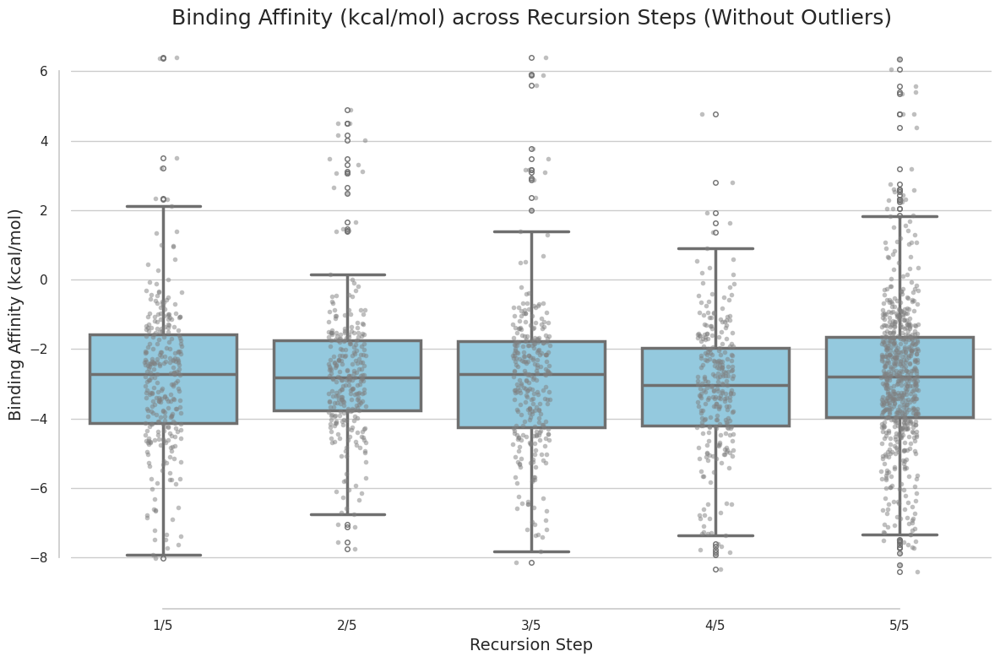

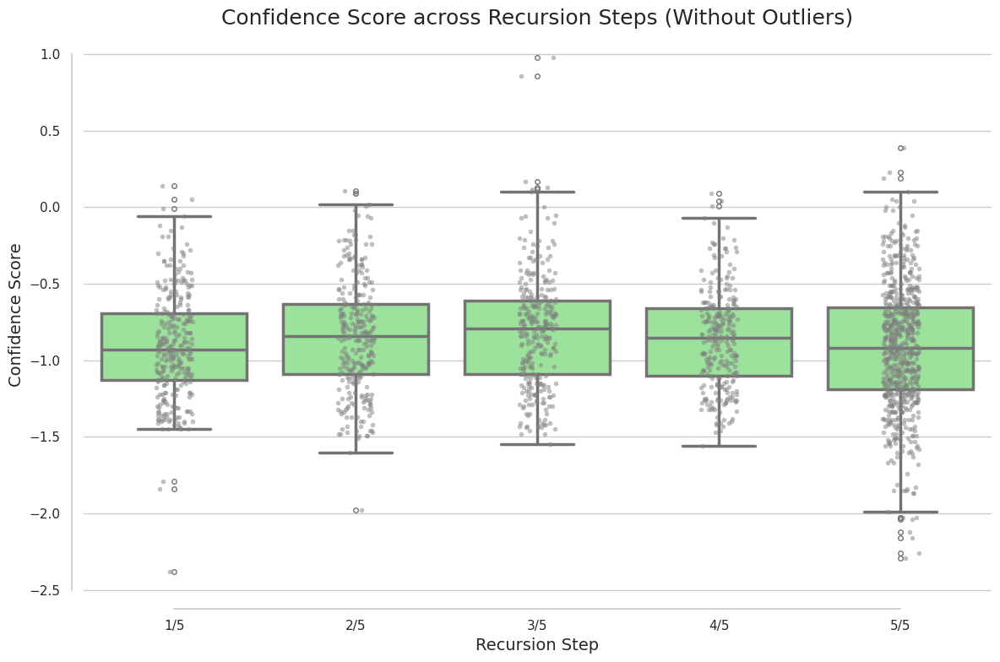

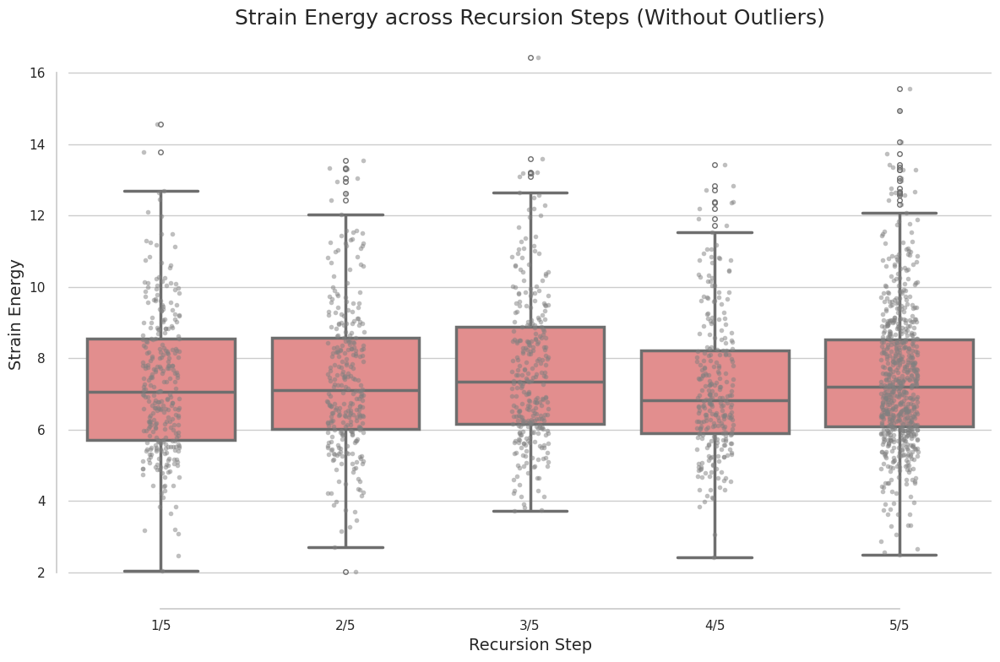

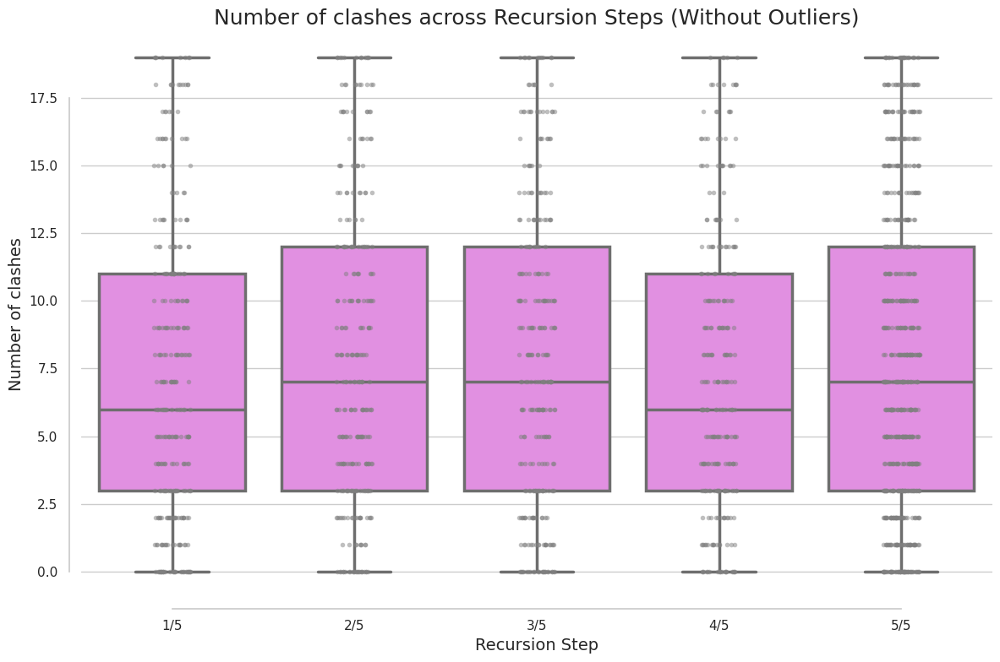

In [16]:
# Function to remove outliers using the IQR method
def remove_outliers(df, column_name):
    Q1 = df[column_name].quantile(0.1)
    Q3 = df[column_name].quantile(0.9)
    IQR = Q3 - Q1
    lower_bound = Q1 - 1.5 * IQR
    upper_bound = Q3 + 1.5 * IQR
    return df[(df[column_name] >= lower_bound) & (df[column_name] <= upper_bound)]

# Function to plot a fancy boxplot for a given column
def plot_fancy_boxplot(data, column_name, recursion_steps, color):
    cleaned_data = remove_outliers(data, column_name)
    plt.figure(figsize=(12, 8))
    ax = sns.boxplot(x='Recursion Step', y=column_name, data=cleaned_data, fliersize=4, linewidth=2.5, color=color)
    sns.stripplot(x='Recursion Step', y=column_name, data=cleaned_data, jitter=True, size=4, color='gray', alpha=0.5)
    plt.title(f'{column_name} across Recursion Steps (Without Outliers)', fontsize=18)
    plt.xlabel('Recursion Step', fontsize=14)
    plt.ylabel(column_name, fontsize=14)
    plt.xticks(fontsize=12)
    plt.yticks(fontsize=12)
    sns.despine(offset=10, trim=True)
    plt.tight_layout()
    plt.show()

# Load the data and concatenate it with recursion step labels
base_dir = '/fast/AG_Akalin/asarigun/Arcas_Stage_1/ROOF/COMPASS/experiments/HURI/data/'
output_file_template = 'filtered_proteins_from_summary_rec{}.csv'
all_data = pd.DataFrame()

for step in range(1, 6):
    file_path = f'{base_dir}{output_file_template.format(step)}'
    df = pd.read_csv(file_path)
    df['Recursion Step'] = f'{step}/5'
    all_data = pd.concat([all_data, df])

# List of columns to create boxplots for
columns_to_plot = [
    'Binding Affinity (kcal/mol)', 
    'Confidence Score', 
    'Strain Energy', 
    'Number of clashes'
]

colors = {
    'Binding Affinity (kcal/mol)': 'skyblue', 
    'Confidence Score': 'lightgreen', 
    'Strain Energy': 'lightcoral', 
    'Number of clashes': 'violet'
}

# Plot fancy boxplots for all specified columns with colors
for column in columns_to_plot:
    plot_fancy_boxplot(all_data, column, range(1, 6), colors[column])

## Violin Plots (Binding Affinity, Strain Energy, Number of Clashes) of Each Recursive Step

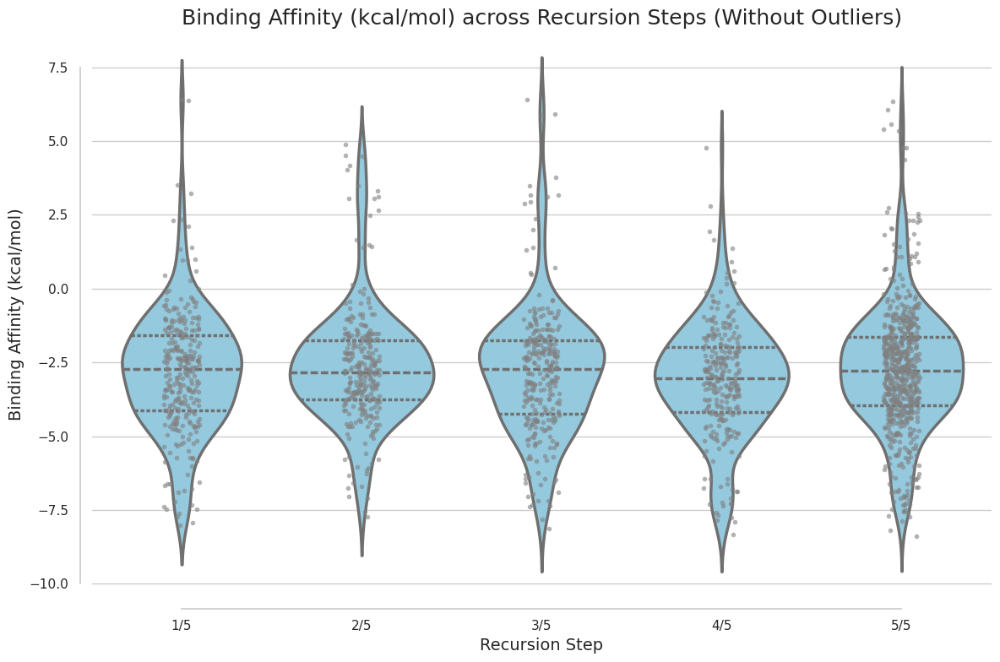

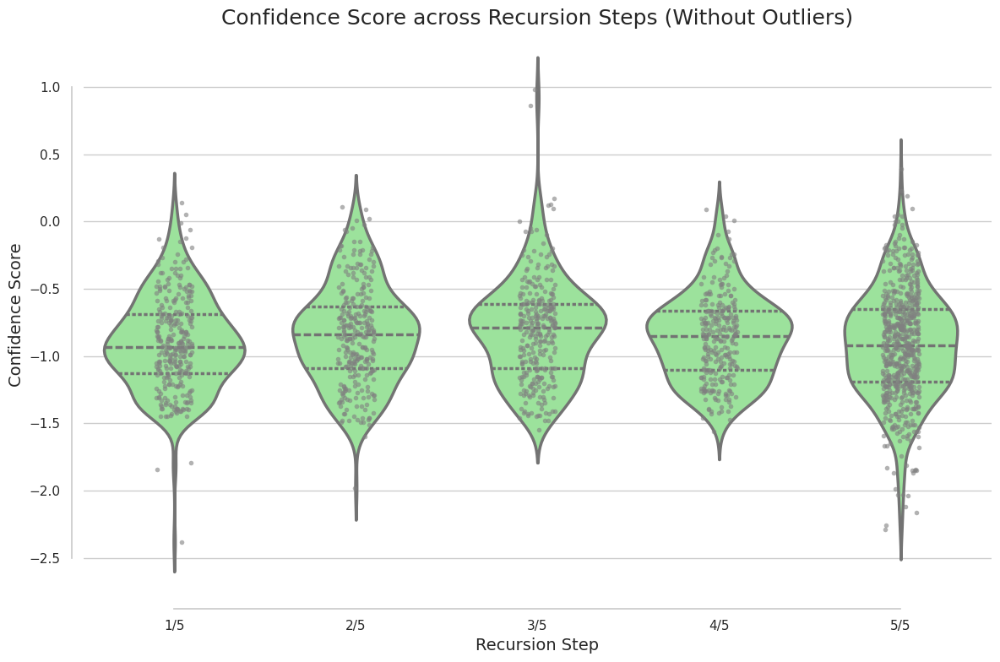

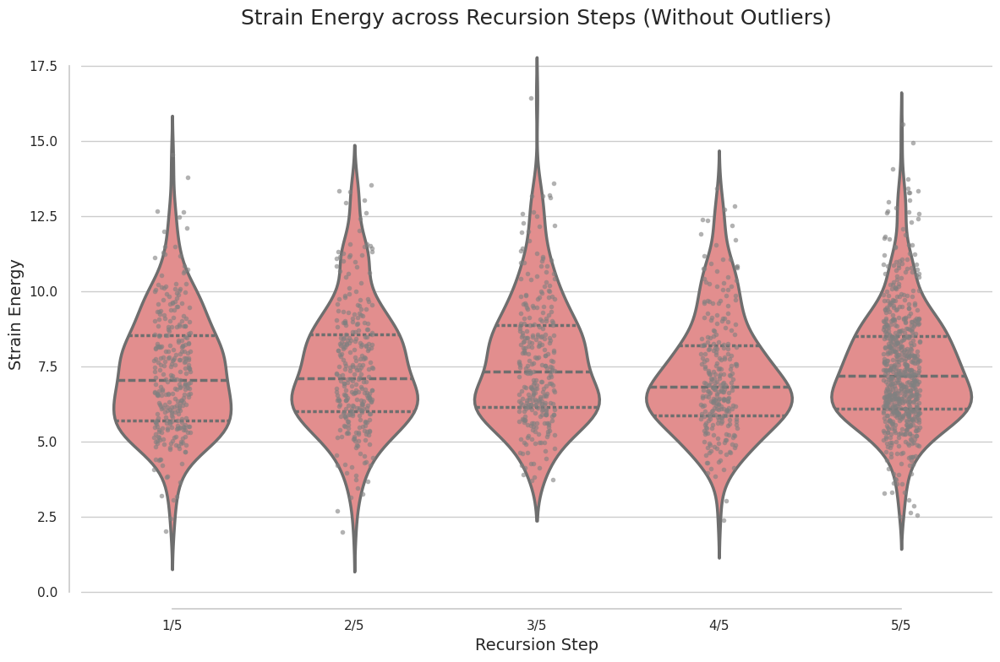

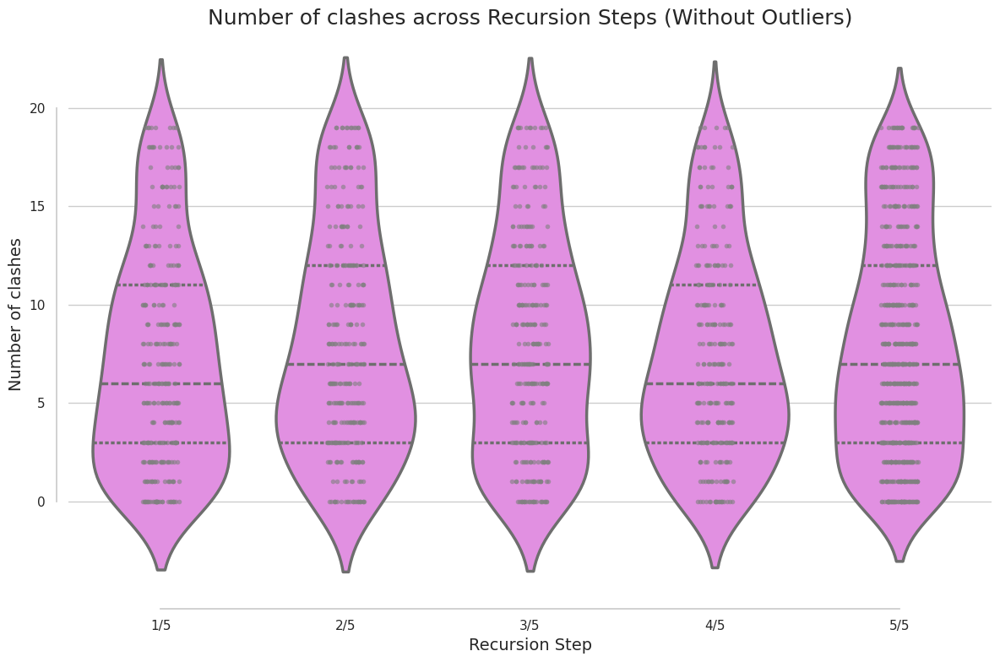

In [17]:
# Function to plot a fancy violin plot for a given column
def plot_fancy_violin_plot(data, column_name, recursion_steps, color):
    cleaned_data = remove_outliers(data, column_name)
    plt.figure(figsize=(12, 8))
    sns.violinplot(x='Recursion Step', y=column_name, data=cleaned_data, inner='quartile', linewidth=2.5, color=color)
    sns.stripplot(x='Recursion Step', y=column_name, data=cleaned_data, jitter=True, size=4, color='grey', alpha=0.6)
    plt.title(f'{column_name} across Recursion Steps (Without Outliers)', fontsize=18)
    plt.xlabel('Recursion Step', fontsize=14)
    plt.ylabel(column_name, fontsize=14)
    plt.xticks(fontsize=12)
    plt.yticks(fontsize=12)
    sns.despine(offset=10, trim=True)
    plt.tight_layout()
    plt.show()

# Assuming 'base_dir' and 'output_file_template' have been defined and the data has been loaded.
# Assuming 'all_data' DataFrame is ready and contains 'Recursion Step' column

# List of columns to create violin plots for
columns_to_plot = [
    'Binding Affinity (kcal/mol)', 
    'Confidence Score', 
    'Strain Energy', 
    'Number of clashes'
]

colors = {
    'Binding Affinity (kcal/mol)': 'skyblue', 
    'Confidence Score': 'lightgreen', 
    'Strain Energy': 'lightcoral', 
    'Number of clashes': 'violet'
}

# Plot fancy boxplots for all specified columns with colors
for column in columns_to_plot:
    plot_fancy_violin_plot(all_data, column, range(1, 6), colors[column])


## Comparative Analysis (t-tests, ANOVA, Kruskal-Wallis test, Tukey HSD test)

In [18]:
import scipy.stats as stats

# Function to perform t-tests between recursion steps for a given column
def perform_t_tests(data, column_name):
    unique_steps = data['Recursion Step'].unique()
    for i in range(len(unique_steps)):
        for j in range(i+1, len(unique_steps)):
            step_i = data[data['Recursion Step'] == unique_steps[i]][column_name]
            step_j = data[data['Recursion Step'] == unique_steps[j]][column_name]
            t_stat, p_val = stats.ttest_ind(step_i, step_j, equal_var=False)
            print(f"T-test between {unique_steps[i]} and {unique_steps[j]} for {column_name}:")
            print(f"T-statistic: {t_stat}, P-value: {p_val}")
            print("\n")

# Function to perform ANOVA across all recursion steps for a given column
def perform_anova(data, column_name):
    data_groups = [data[data['Recursion Step'] == step][column_name] for step in data['Recursion Step'].unique()]
    f_stat, p_val = stats.f_oneway(*data_groups)
    print(f"ANOVA for {column_name}:")
    print(f"F-statistic: {f_stat}, P-value: {p_val}")
    print("\n")

# Function to perform non-parametric Kruskal-Wallis test across all recursion steps for a given column
def perform_kruskal_wallis(data, column_name):
    data_groups = [data[data['Recursion Step'] == step][column_name] for step in data['Recursion Step'].unique()]
    h_stat, p_val = stats.kruskal(*data_groups)
    print(f"Kruskal-Wallis test for {column_name}:")
    print(f"H-statistic: {h_stat}, P-value: {p_val}")
    print("\n")

# Assuming 'all_data' DataFrame is ready and contains 'Recursion Step' column


column_to_analyze = [
    'Binding Affinity (kcal/mol)', 
    'Confidence Score', 
    'Strain Energy', 
    'Number of clashes'
]

for column in column_to_analyze:
    # Perform t-tests
    perform_t_tests(all_data, column)

    # Perform ANOVA
    perform_anova(all_data, column)

    # Perform Kruskal-Wallis test
    perform_kruskal_wallis(all_data, column)




T-test between 1/5 and 2/5 for Binding Affinity (kcal/mol):
T-statistic: -0.044419295216521756, P-value: 0.9645854322488148


T-test between 1/5 and 3/5 for Binding Affinity (kcal/mol):
T-statistic: 1.1230120039074527, P-value: 0.261907345050233


T-test between 1/5 and 4/5 for Binding Affinity (kcal/mol):
T-statistic: 2.6454405212033643, P-value: 0.008407721761630179


T-test between 1/5 and 5/5 for Binding Affinity (kcal/mol):
T-statistic: 0.21286958230899813, P-value: 0.8315139144718604


T-test between 2/5 and 3/5 for Binding Affinity (kcal/mol):
T-statistic: 1.2703746893625951, P-value: 0.20446322328254246


T-test between 2/5 and 4/5 for Binding Affinity (kcal/mol):
T-statistic: 2.961578354708523, P-value: 0.0031968984360518393


T-test between 2/5 and 5/5 for Binding Affinity (kcal/mol):
T-statistic: 0.29246876057691373, P-value: 0.7700376874463968


T-test between 3/5 and 4/5 for Binding Affinity (kcal/mol):
T-statistic: 1.6917689857462415, P-value: 0.09124859466404171


T-test

/tmp/ipykernel_2479416/498102362.py:40: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  ax = sns.boxplot(x='Recursion Step', y=column_name, data=cleaned_data, palette="Set3")


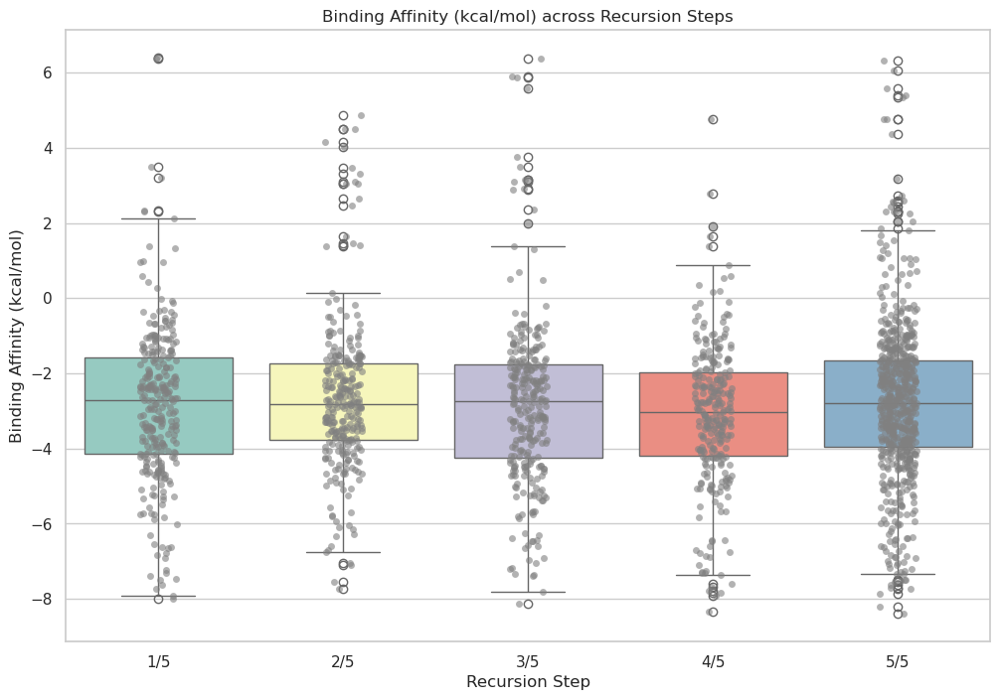

/tmp/ipykernel_2479416/498102362.py:47: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  sns.violinplot(x='Recursion Step', y=column_name, data=cleaned_data, inner='quartile', palette="Set2")


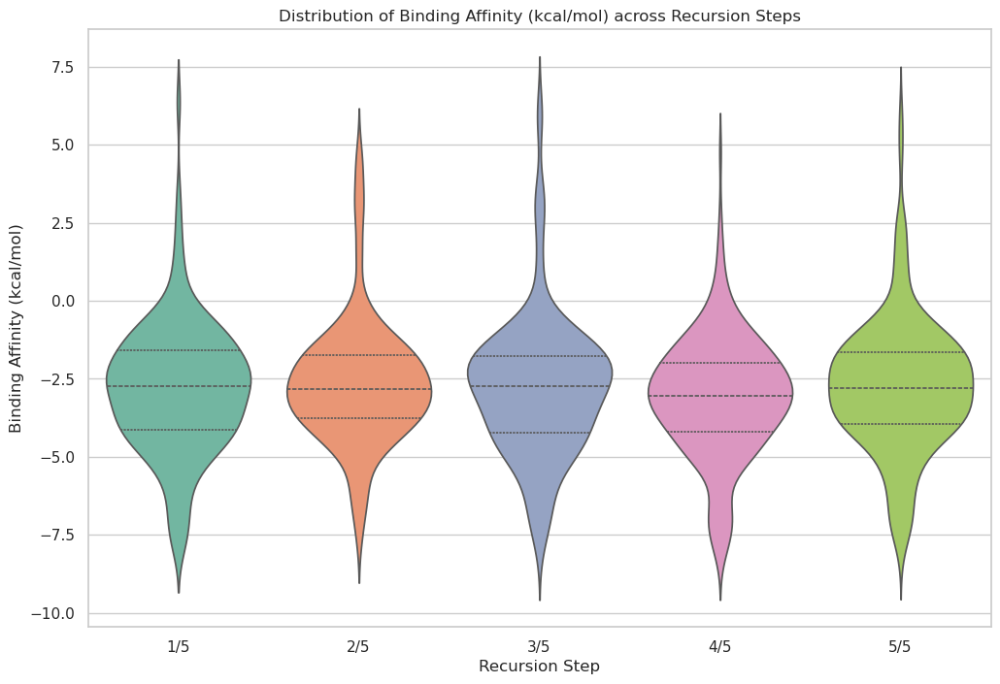

ANOVA for Binding Affinity (kcal/mol): F-value = 2.669052582277168, P-value = 0.03077934679041956
Significant differences found. Consider conducting post-hoc tests for pairwise comparisons.
Conducting post-hoc test...
Multiple Comparison of Means - Tukey HSD, FWER=0.05
group1 group2 meandiff p-adj   lower  upper  reject
---------------------------------------------------
   1/5    2/5   0.1803   0.84 -0.2961 0.6566  False
   1/5    3/5   0.0367 0.9996 -0.4363 0.5098  False
   1/5    4/5  -0.2677  0.551 -0.7493 0.2139  False
   1/5    5/5    0.085 0.9783 -0.3169  0.487  False
   2/5    3/5  -0.1435 0.9239 -0.6203 0.3332  False
   2/5    4/5   -0.448 0.0866 -0.9332 0.0373  False
   2/5    5/5  -0.0952 0.9685 -0.5016 0.3112  False
   3/5    4/5  -0.3044  0.419 -0.7865 0.1776  False
   3/5    5/5   0.0483 0.9975 -0.3542 0.4508  False
   4/5    5/5   0.3527 0.1344 -0.0598 0.7653  False
---------------------------------------------------


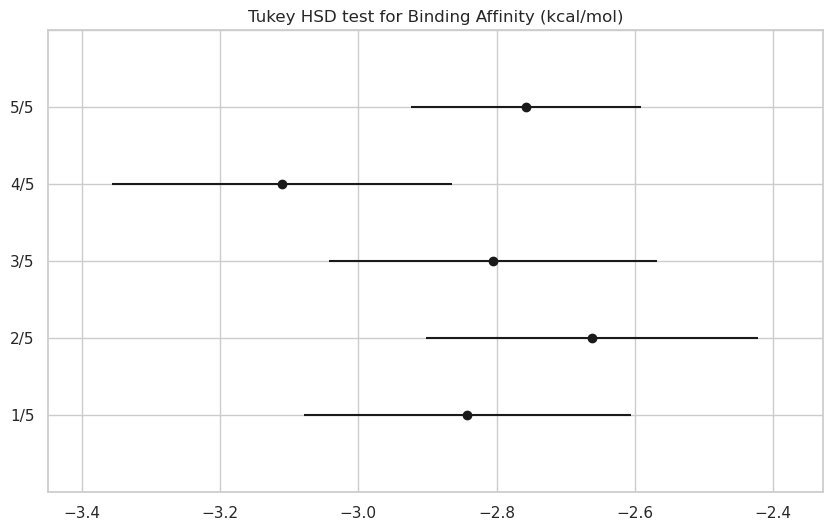

/tmp/ipykernel_2479416/498102362.py:40: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  ax = sns.boxplot(x='Recursion Step', y=column_name, data=cleaned_data, palette="Set3")


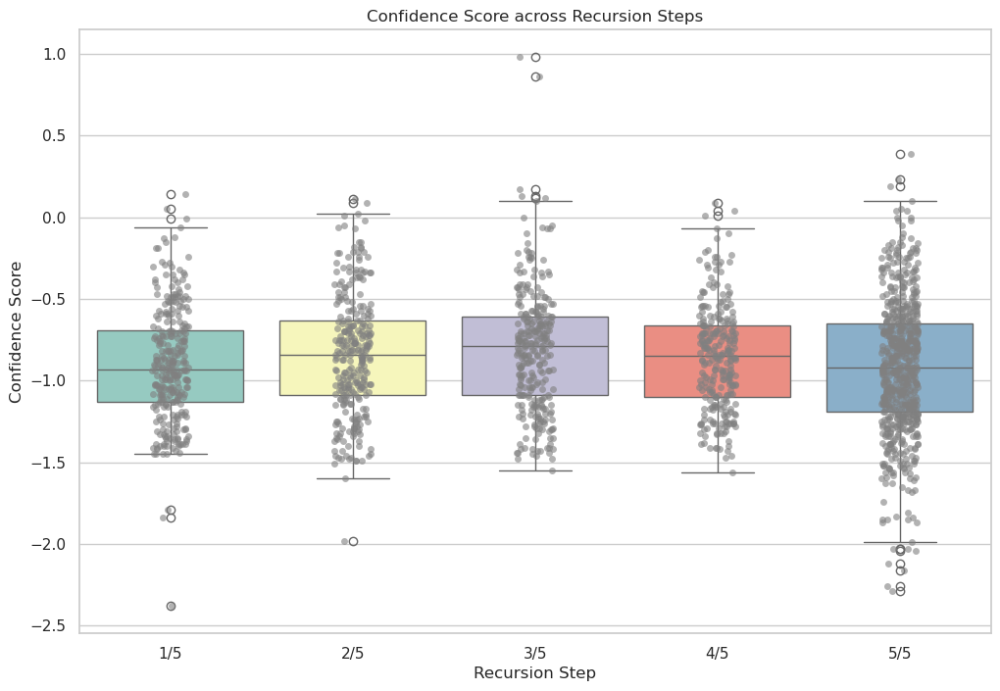

/tmp/ipykernel_2479416/498102362.py:47: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  sns.violinplot(x='Recursion Step', y=column_name, data=cleaned_data, inner='quartile', palette="Set2")


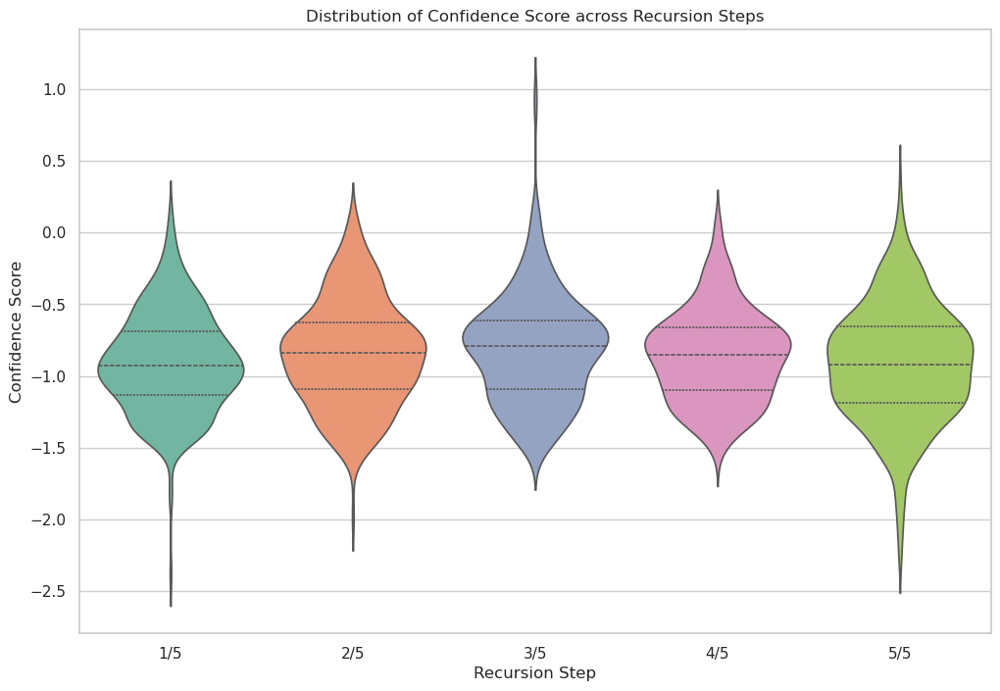

ANOVA for Confidence Score: F-value = 0.4415537993535014, P-value = 0.7786367832610068
No significant differences found across Recursion Steps.


/tmp/ipykernel_2479416/498102362.py:40: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  ax = sns.boxplot(x='Recursion Step', y=column_name, data=cleaned_data, palette="Set3")


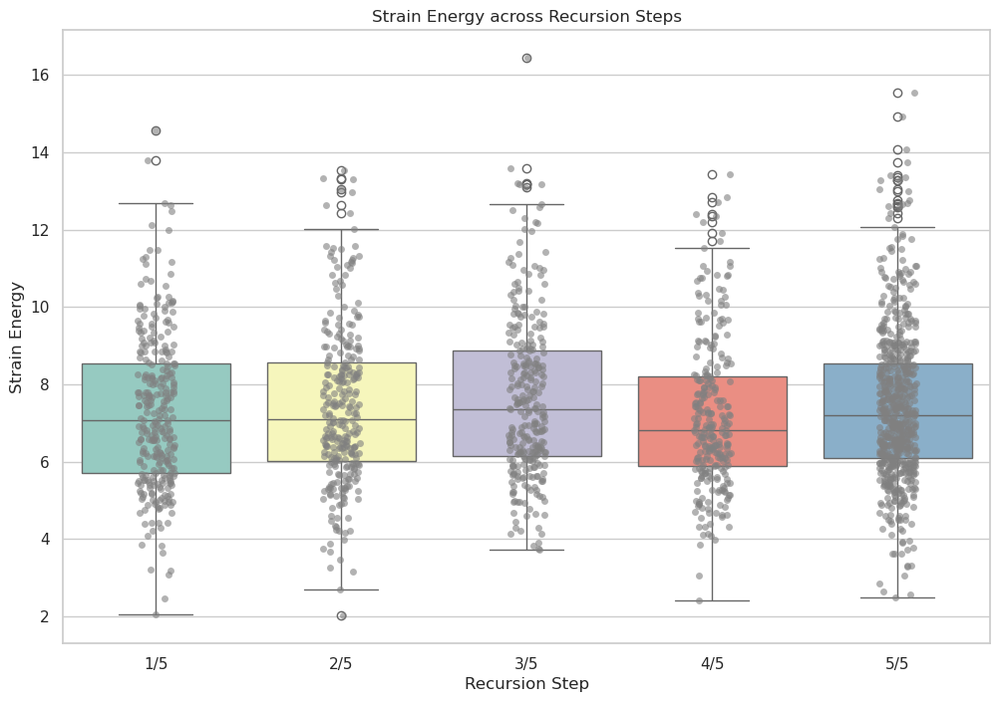

/tmp/ipykernel_2479416/498102362.py:47: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  sns.violinplot(x='Recursion Step', y=column_name, data=cleaned_data, inner='quartile', palette="Set2")


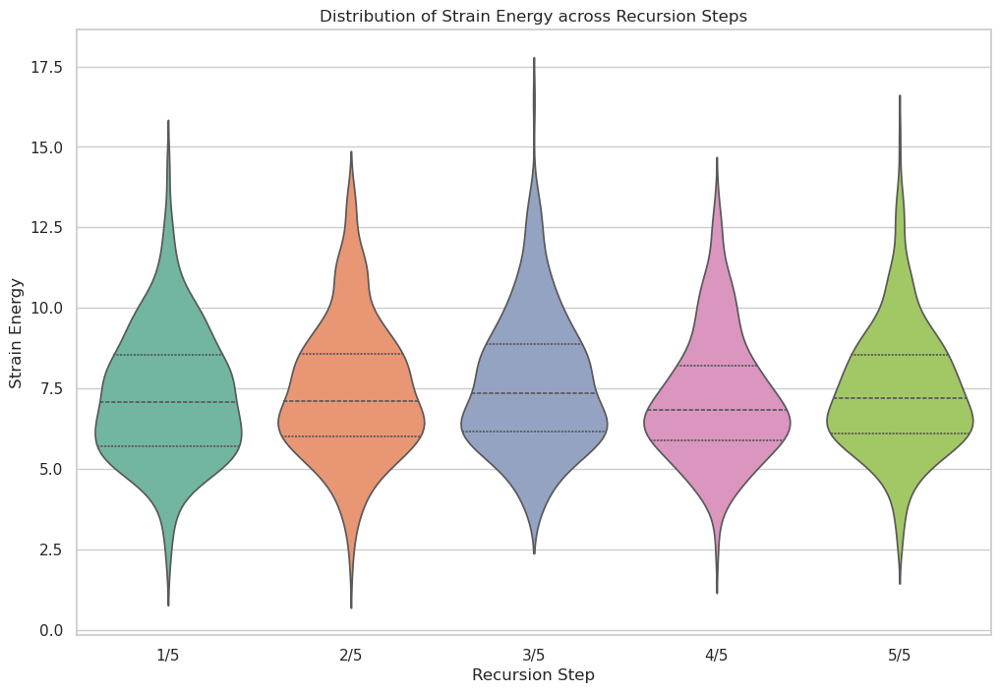

ANOVA for Strain Energy: F-value = 1.8800409275221937, P-value = 0.11131955708143787
No significant differences found across Recursion Steps.


/tmp/ipykernel_2479416/498102362.py:40: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  ax = sns.boxplot(x='Recursion Step', y=column_name, data=cleaned_data, palette="Set3")


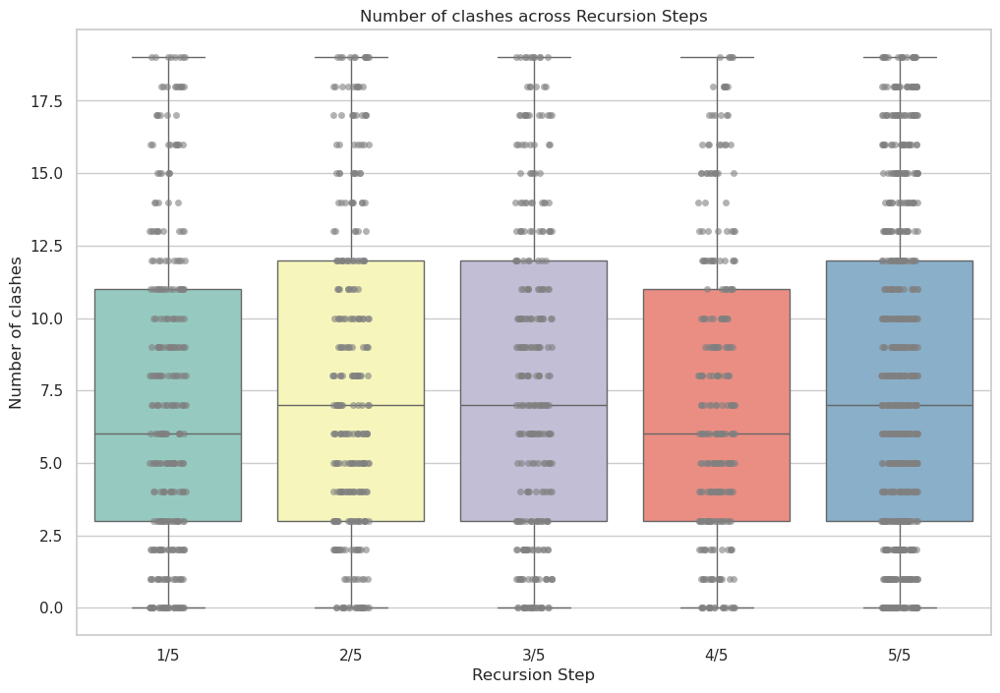

/tmp/ipykernel_2479416/498102362.py:47: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  sns.violinplot(x='Recursion Step', y=column_name, data=cleaned_data, inner='quartile', palette="Set2")


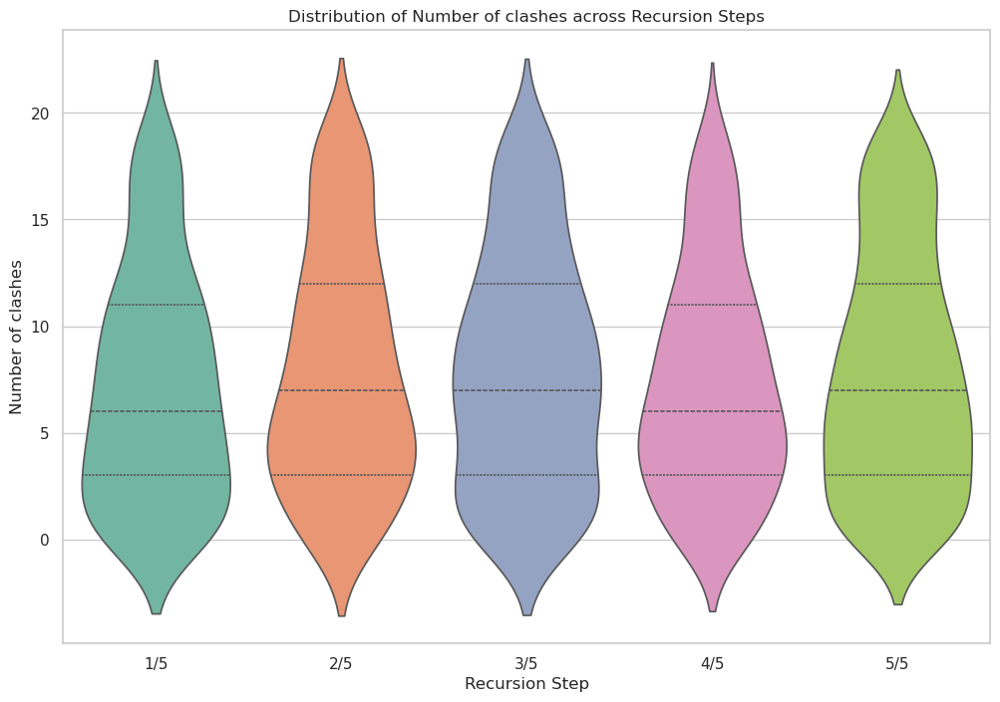

ANOVA for Number of clashes: F-value = 1.2805626460371995, P-value = 0.2754138316744399
No significant differences found across Recursion Steps.


In [19]:
import pandas as pd
import scipy.stats as stats
import seaborn as sns
import matplotlib.pyplot as plt


from statsmodels.stats.multicomp import pairwise_tukeyhsd
import pandas as pd

# Assuming 'all_data' is your DataFrame and it includes 'Recursion Step' and the metric of interest

def tukey_hsd_posthoc_test(data, column_name):
    # Perform the Tukey HSD test
    tukey_result = pairwise_tukeyhsd(endog=data[column_name], 
                                     groups=data['Recursion Step'], 
                                     alpha=0.05)  # alpha is the significance level
    
    # Print the summary of the test results
    print(tukey_result)
    
    # Plot the results
    tukey_result.plot_simultaneous()
    plt.title(f'Tukey HSD test for {column_name}')
    plt.show()
    
# Load your dataset
# Ensure 'all_data' DataFrame is prepared with 'Recursion Step' and the metrics columns

# Define a function to annotate statistical significance on plots
def annotate_significance(ax, x1, x2, max_y, text):
    y = max_y + max_y * 0.02  # Slightly above the highest data point
    ax.plot([x1, x1, x2, x2], [y, y+1, y+1, y], lw=1.5, c='black')
    ax.text((x1+x2)*.5, y+1, text, ha='center', va='bottom', color='black')

# Function to visualize and statistically compare groups
def visualize_and_compare(data, column_name):
    cleaned_data = remove_outliers(data, column_name)
    # First, visualize with boxplot
    plt.figure(figsize=(12, 8))
    ax = sns.boxplot(x='Recursion Step', y=column_name, data=cleaned_data, palette="Set3")
    sns.stripplot(x='Recursion Step', y=column_name, data=cleaned_data, color='grey', alpha=0.6, jitter=True)
    plt.title(f'{column_name} across Recursion Steps')
    plt.show()
    
    # Then, visualize with violin plot
    plt.figure(figsize=(12, 8))
    sns.violinplot(x='Recursion Step', y=column_name, data=cleaned_data, inner='quartile', palette="Set2")
    plt.title(f'Distribution of {column_name} across Recursion Steps')
    plt.show()
    
    # Perform ANOVA or Kruskal-Wallis test
    groups = [group[column_name].dropna() for name, group in data.groupby('Recursion Step')]
    if all(group.size > 1 for group in groups):  # Ensure all groups have more than one observation
        f_val, p_val = stats.f_oneway(*groups)
        print(f"ANOVA for {column_name}: F-value = {f_val}, P-value = {p_val}")
        
        if p_val < 0.05:
            print("Significant differences found. Consider conducting post-hoc tests for pairwise comparisons.")
            print("Conducting post-hoc test...")
            tukey_hsd_posthoc_test(cleaned_data, column_name)
        else:
            print("No significant differences found across Recursion Steps.")
    else:
        print("Not all groups have sufficient data for ANOVA.")



column_to_analyze = [
    'Binding Affinity (kcal/mol)', 
    'Confidence Score', 
    'Strain Energy', 
    'Number of clashes'
]

for column in column_to_analyze:
    visualize_and_compare(all_data, column)

# Note: This is a basic implementation. For post-hoc tests, consider using Tukey's HSD or pairwise t-tests with Bonferroni correction.


## PCA

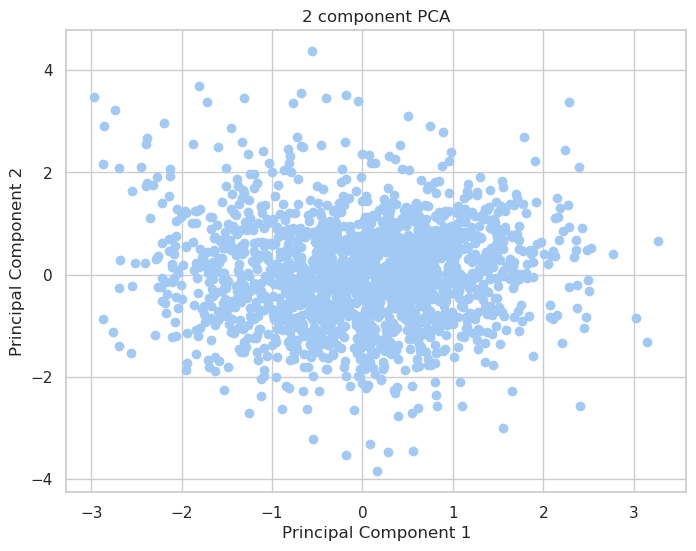

Explained variance ratio: [0.26322924 0.2599525 ]


In [20]:
from sklearn.preprocessing import StandardScaler
from sklearn.decomposition import PCA
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt

# Assuming 'all_data' is your DataFrame

# Outlier removal function
def remove_outliers(df, column_name):
    Q1 = df[column_name].quantile(0.1)
    Q3 = df[column_name].quantile(0.9)
    IQR = Q3 - Q1
    lower_bound = Q1 - 1.5 * IQR
    upper_bound = Q3 + 1.5 * IQR
    return df[(df[column_name] >= lower_bound) & (df[column_name] <= upper_bound)]

# List of features to include in PCA
features = ['Binding Affinity (kcal/mol)', 'Confidence Score', 'Strain Energy', 'Number of clashes']

# Apply outlier removal for each feature
cleaned_data = pd.DataFrame()
for feature in features:
    if cleaned_data.empty:
        cleaned_data = remove_outliers(all_data, feature)
    else:
        cleaned_data = remove_outliers(cleaned_data, feature)

# Standardizing the features
x = cleaned_data.loc[:, features].values
x = StandardScaler().fit_transform(x)

# Performing PCA
pca = PCA(n_components=2)  # You can adjust n_components based on your needs
principalComponents = pca.fit_transform(x)

# Create a DataFrame with the principal components
principalDf = pd.DataFrame(data=principalComponents, columns=['Principal Component 1', 'Principal Component 2'])

# Visualizing the PCA results
plt.figure(figsize=(8,6))
plt.scatter(principalDf['Principal Component 1'], principalDf['Principal Component 2'])
plt.xlabel('Principal Component 1')
plt.ylabel('Principal Component 2')
plt.title('2 component PCA')
plt.grid(True)
plt.show()

# Displaying explained variance ratio
print(f"Explained variance ratio: {pca.explained_variance_ratio_}")


## One-Sample t-Test

In [21]:
from scipy import stats

# One-sample t-test example
def one_sample_t_test(data, column_name, population_mean):
    """
    Test if the mean of the sample in `column_name` is equal to `population_mean`.
    """
    t_stat, p_val = stats.ttest_1samp(data[column_name].dropna(), population_mean)
    print(f"One-sample t-test for {column_name}:")
    print(f"T-statistic: {t_stat}, P-value: {p_val}")

features = ['Binding Affinity (kcal/mol)', 'Confidence Score', 'Strain Energy', 'Number of clashes']


for feat in features:
    one_sample_t_test(all_data, feat, 0)



One-sample t-test for Binding Affinity (kcal/mol):
T-statistic: -39.029120385215386, P-value: 4.45670021273879e-243
One-sample t-test for Confidence Score:
T-statistic: -31.66878287112672, P-value: 5.9305825561768514e-176
One-sample t-test for Strain Energy:
T-statistic: 156.49570686563072, P-value: 0.0
One-sample t-test for Number of clashes:
T-statistic: 60.25349624589009, P-value: 0.0


## ANOVA Test

In [22]:
def anova_test(data, column_name):
    """
    Test if at least one group mean of `column_name` is different from the others.
    """
    group_data = [group.dropna() for name, group in data.groupby('Recursion Step')[column_name]]
    f_stat, p_val = stats.f_oneway(*group_data)
    print(f"ANOVA for {column_name}:")
    print(f"F-statistic: {f_stat}, P-value: {p_val}")


for feat in features:
    # Example usage for 'Binding Affinity (kcal/mol)' across recursion steps
    anova_test(all_data, feat)


ANOVA for Binding Affinity (kcal/mol):
F-statistic: 2.669052582277168, P-value: 0.03077934679041956
ANOVA for Confidence Score:
F-statistic: 0.4415537993535014, P-value: 0.7786367832610068
ANOVA for Strain Energy:
F-statistic: 1.8800409275221937, P-value: 0.11131955708143787
ANOVA for Number of clashes:
F-statistic: 1.2805626460371995, P-value: 0.2754138316744399
